# Importing Important Libraries

In [2]:
import numpy as np     # importing numy for arrays and numerical computations
import pandas as pd       # importing pandas for data manipualtion
import calendar   
import seaborn as sns               # importing some visaulization libraries
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib import ticker
from matplotlib.ticker import FuncFormatter
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
import matplotlib as mpl
import matplotlib.patches as patches
from matplotlib.patches import ConnectionPatch
from matplotlib.gridspec import GridSpec
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
from collections import OrderedDict   # importing ordered dictionary
from collections import Counter
import warnings                   #importing warnings
warnings.filterwarnings('ignore')
import random        # setting displaying setting of notebook
plt.style.use('fivethirtyeight')
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 200)
plt.rcParams["figure.figsize"] = (15,7)
%matplotlib inline

# Reading Data from Different Raw_Files

In [4]:
customers = pd.read_csv('Olist_Dataset/olist_customers_dataset.csv')      # reading raw customers data file
sellers = pd.read_csv('Olist_Dataset/olist_sellers_dataset.csv')         # reading raw sellers data file
products = pd.read_csv('Olist_Dataset/olist_products_dataset.csv')          # reading raw products data file
orders = pd.read_csv('Olist_Dataset/olist_orders_dataset.csv')           # reading raw orders data file
order_items = pd.read_csv('Olist_Dataset/olist_order_items_dataset.csv')   # reading raw order_items data file
order_payments = pd.read_csv('Olist_Dataset/olist_order_payments_dataset.csv')     # reading raw order_payments data file
order_reviews = pd.read_csv('Olist_Dataset/olist_order_reviews_dataset.csv')        # reading raw order_reviews data file
geolocation = pd.read_csv('Olist_Dataset/olist_geolocation_dataset.csv')       # reading raw geolocation data file
products_translation = pd.read_csv('Olist_Dataset/product_category_name_translation.csv') # reading raw products_translation data file

Since raw_data may contain some duplicate records, thus its good to remove redundancy of data by removimg duplicate records

In [6]:
customers.drop_duplicates(inplace=True)       # dropping duplicate data from each of the data files
sellers.drop_duplicates(inplace=True)
products.drop_duplicates(inplace=True)
orders.drop_duplicates(inplace=True)
order_items.drop_duplicates(inplace=True)
order_payments.drop_duplicates(inplace=True)
order_reviews.drop_duplicates(inplace=True)
geolocation.drop_duplicates(inplace=True)

# Basic Analysis of Different Data

## Customers Data 

In [9]:
print("Customers database contains", customers.shape[0], "rows and", customers.shape[1], "columns.\n")  # checking shape of data and its first five rows
print('First Five rows of customers data are:')
customers.head()

Customers database contains 99441 rows and 5 columns.

First Five rows of customers data are:


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [10]:
print('Basic info about customers data:')      # Basic Info of customers data
customers.info()

Basic info about customers data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [11]:
print('Null Value count in customers data are:')   # checking null values in data
customers.isnull().sum()

Null Value count in customers data are:


customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

## Sellers Data 

In [13]:
print("sellers database contains", sellers.shape[0], "rows and", sellers.shape[1], "columns.") # checking shape of data and its first five rows
sellers.head()

sellers database contains 3095 rows and 4 columns.


,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [14]:
print('Basic info about sellers data:')     # getting basic info of data
sellers.info()

Basic info about sellers data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


In [15]:
print('Null Value count in sellers data are:')    # checking null values in the data
sellers.isnull().sum()

Null Value count in sellers data are:


seller_id                 0
seller_zip_code_prefix    0
seller_city               0
seller_state              0
dtype: int64

## Products Data 

In [17]:
print("products database contains", products.shape[0], "rows and", products.shape[1], "columns.")          # checking shape of data and its first five rows
products.head()

products database contains 32951 rows and 9 columns.


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [18]:
print('Basic info about products data:')         # getting basic info of data
products.info()

Basic info about products data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [19]:
print('Null Value count in products data are:')           # checking null values in the data
products.isnull().sum()

Null Value count in products data are:


product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

## Orders Data

In [21]:
print("orders database contains", orders.shape[0], "rows and", orders.shape[1], "columns.")           # checking shape of data and its first five rows
orders.head()

orders database contains 99441 rows and 8 columns.


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [22]:
print('Basic info about orders data:')            # getting basic info of data
orders.info()

Basic info about orders data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [23]:
print('Null Value count in orders data are:')          # checking null values in the data
orders.isnull().sum()

Null Value count in orders data are:


order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

## Order_Items Data

In [25]:
print("order_items database contains", order_items.shape[0], "rows and", order_items.shape[1], "columns.")          # checking shape of data and its first five rows
order_items.head()

order_items database contains 112650 rows and 7 columns.


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [26]:
print('Basic info about order_items data:')                 # getting basic info of data
order_items.info()

Basic info about order_items data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [27]:
print('Null Value count in order_items data are:')              # checking null values in the data
order_items.isnull().sum()

Null Value count in order_items data are:


order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

## Order_Payments Data

In [29]:
print("order_payments database contains", order_payments.shape[0], "rows and", order_payments.shape[1], "columns.")      # checking shape of data and its first five rows
order_payments.head()

order_payments database contains 103886 rows and 5 columns.


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [30]:
print('Basic info about order_payments data:')       # getting basic info of data
order_payments.info()

Basic info about order_payments data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [31]:
print('Null Value count in order_payments data are:')          # checking null values in the data
order_payments.isnull().sum()

Null Value count in order_payments data are:


order_id                0
payment_sequential      0
payment_type            0
payment_installments    0
payment_value           0
dtype: int64

## Order_Reviews Data 

In [33]:
print("order_reviews database contains", order_reviews.shape[0], "rows and", order_reviews.shape[1], "columns.")    # checking shape of data and its first five rows
order_reviews.head()

order_reviews database contains 99224 rows and 7 columns.


,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [34]:
print('Basic info about order_reviews data:')          # getting basic info of data
order_reviews.info()

Basic info about order_reviews data:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [35]:
print('Null Value count in order_reviews data are:')           # checking null values in the data
order_reviews.isnull().sum()

Null Value count in order_reviews data are:


review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

## Geolocation Data

In [37]:
print("geolocation database contains", geolocation.shape[0], "rows and", geolocation.shape[1], "columns.")       # checking shape of data and its first five rows
geolocation.head()

geolocation database contains 738332 rows and 5 columns.


,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [38]:
print('Basic info about geolocation data:')                  # getting basic info of data
geolocation.info()

Basic info about geolocation data:
<class 'pandas.core.frame.DataFrame'>
Index: 738332 entries, 0 to 1000161
Data columns (total 5 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   geolocation_zip_code_prefix  738332 non-null  int64  
 1   geolocation_lat              738332 non-null  float64
 2   geolocation_lng              738332 non-null  float64
 3   geolocation_city             738332 non-null  object 
 4   geolocation_state            738332 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 33.8+ MB


In [39]:
print('Null Value count in geolocation data are:')        # checking null values in the data
geolocation.isnull().sum()

Null Value count in geolocation data are:


geolocation_zip_code_prefix    0
geolocation_lat                0
geolocation_lng                0
geolocation_city               0
geolocation_state              0
dtype: int64

Since the number of datasets are large thus it is difficult to reatin the critical information and visuaize the differences among datasets, so lets make various dataframes which contains summarize information of each dataset

## Data Preprocessing 

### Summarization of Dataset's Information

#### Column Numbers, Column Names and Rows Summary of Each dataset

In [44]:
#checking number of columns , column_names and no_of_rows in each dataset
all_datasets = [customers,sellers,products, orders, order_items, order_payments,order_reviews,geolocation,products_translation]
data_titles = ['customers','sellers','products','orders', 'order_items', 'order_payments','order_reviews','geolocation','product_translation']

data_info = pd.DataFrame({},)
data_info['all_datasets']= data_titles

data_info['Columns']= [len(df.columns) for df in all_datasets ]
data_info['Column_name']= [', '.join(list(df.columns)) for df in all_datasets] 
data_info['Rows'] = [len(df) for df in all_datasets]

data_info.style.background_gradient(cmap='RdBu')

,all_datasets,Columns,Column_name,Rows
0,customers,5,"customer_id, customer_unique_id, customer_zip_code_prefix, customer_city, customer_state",99441
1,sellers,4,"seller_id, seller_zip_code_prefix, seller_city, seller_state",3095
2,products,9,"product_id, product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm",32951
3,orders,8,"order_id, customer_id, order_status, order_purchase_timestamp, order_approved_at, order_delivered_carrier_date, order_delivered_customer_date, order_estimated_delivery_date",99441
4,order_items,7,"order_id, order_item_id, product_id, seller_id, shipping_limit_date, price, freight_value",112650
5,order_payments,5,"order_id, payment_sequential, payment_type, payment_installments, payment_value",103886
6,order_reviews,7,"review_id, order_id, review_score, review_comment_title, review_comment_message, review_creation_date, review_answer_timestamp",99224
7,geolocation,5,"geolocation_zip_code_prefix, geolocation_lat, geolocation_lng, geolocation_city, geolocation_state",738332
8,product_translation,2,"product_category_name, product_category_name_english",71


Dataset with maximum number of columns is products.
Dataset with maximum number of rows is geolocations

#### Numerical, Categorical and Boolean Columns Summary of Each Dataset

In [47]:
#checking dtypes
all_datasets = [customers,sellers,products, orders, order_items, order_payments,order_reviews,geolocation,products_translation]
data_titles = ['customers','sellers','products','orders', 'order_items', 'order_payments','order_reviews','geolocation','product_translation']
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
data_type_info = pd.DataFrame({},)
data_type_info['dataset']= data_titles

data_type_info['numeric_features'] = [len((df.select_dtypes(include=numerics)).columns) for df in all_datasets]
data_type_info['num_features_name'] = [', '.join(list((df.select_dtypes(include=numerics)).columns)) for df in all_datasets]
data_type_info['object_features'] = [len((df.select_dtypes(include='object')).columns) for df in all_datasets]
data_type_info['objt_features_name'] = [', '.join(list((df.select_dtypes(include='object')).columns)) for df in all_datasets]
data_type_info['bool_features'] = [len((df.select_dtypes(include='bool')).columns) for df in all_datasets]
data_type_info.style.background_gradient(cmap='tab20')

,dataset,numeric_features,num_features_name,object_features,objt_features_name,bool_features
0,customers,1,customer_zip_code_prefix,4,"customer_id, customer_unique_id, customer_city, customer_state",0
1,sellers,1,seller_zip_code_prefix,3,"seller_id, seller_city, seller_state",0
2,products,7,"product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm",2,"product_id, product_category_name",0
3,orders,0,,8,"order_id, customer_id, order_status, order_purchase_timestamp, order_approved_at, order_delivered_carrier_date, order_delivered_customer_date, order_estimated_delivery_date",0
4,order_items,3,"order_item_id, price, freight_value",4,"order_id, product_id, seller_id, shipping_limit_date",0
5,order_payments,3,"payment_sequential, payment_installments, payment_value",2,"order_id, payment_type",0
6,order_reviews,1,review_score,6,"review_id, order_id, review_comment_title, review_comment_message, review_creation_date, review_answer_timestamp",0
7,geolocation,3,"geolocation_zip_code_prefix, geolocation_lat, geolocation_lng",2,"geolocation_city, geolocation_state",0
8,product_translation,0,,2,"product_category_name, product_category_name_english",0


products dataset has maximum number of numerical features(i.e dtype :'int16', 'int32', 'int64', 'float16', 'float32', 'float64').
orders dataset has maximum number of features of object dtype
We also observe that all the timestamps are in object datatypes.So, we have to convert it into datetime type to do analysis on these features.

#### Null Values Summary of Each Dataset

In [50]:
all_datasets = [customers,sellers,products, orders, order_items, order_payments,order_reviews,geolocation,products_translation]
titles = ['customers','sellers','products','orders', 'order_items', 'order_payments','order_reviews','geolocation','product_translation']
data_desc = pd.DataFrame({},)

data_desc['all_datasets']= titles

#  name of columns in the all_datasets 
data_desc['cols'] = [', '.join([col for col, null in df.isnull().sum().items() ]) for df in all_datasets]

# total number of columns in the all_datasets 
data_desc['cols_no']= [df.shape[1] for df in all_datasets]

#counting total null values
data_desc['null_no']= [df.isnull().sum().sum() for df in all_datasets]

# total number of columns in the all_datasets with null-values 
data_desc['null_cols_no']= [len([col for col, null in df.isnull().sum().items() if null > 0]) for df in all_datasets]
data_desc['null_cols'] = [', '.join([col for col, null in df.isnull().sum().items() if null > 0]) for df in all_datasets]
data_desc.style.background_gradient(cmap='Pastel1_r')

,all_datasets,cols,cols_no,null_no,null_cols_no,null_cols
0,customers,"customer_id, customer_unique_id, customer_zip_code_prefix, customer_city, customer_state",5,0,0,
1,sellers,"seller_id, seller_zip_code_prefix, seller_city, seller_state",4,0,0,
2,products,"product_id, product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm",9,2448,8,"product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm"
3,orders,"order_id, customer_id, order_status, order_purchase_timestamp, order_approved_at, order_delivered_carrier_date, order_delivered_customer_date, order_estimated_delivery_date",8,4908,3,"order_approved_at, order_delivered_carrier_date, order_delivered_customer_date"
4,order_items,"order_id, order_item_id, product_id, seller_id, shipping_limit_date, price, freight_value",7,0,0,
5,order_payments,"order_id, payment_sequential, payment_type, payment_installments, payment_value",5,0,0,
6,order_reviews,"review_id, order_id, review_score, review_comment_title, review_comment_message, review_creation_date, review_answer_timestamp",7,145903,2,"review_comment_title, review_comment_message"
7,geolocation,"geolocation_zip_code_prefix, geolocation_lat, geolocation_lng, geolocation_city, geolocation_state",5,0,0,
8,product_translation,"product_category_name, product_category_name_english",2,0,0,


The maximum number of null-values are present in reviews dataset and the name of the columns with the null-values are review_comment_title and review_comment_message.
products dataset contains least number of null- values but most of its columns has null-values.
we have to deal with these null-values.

Since Columns like review_comment_title, review_creation_date,review_id, review_answer_timestamp are having high null values and cannot be imputed with some any other values and if filled with some random values will certainly result in the noise in the dataset. So here the only way to deal with this problem is to drop these columns

In [53]:
# Dropping columns having high Null values
order_reviews = order_reviews.drop(['review_comment_title','review_creation_date','review_id','review_answer_timestamp'],axis=1)

In [54]:
order_items.rename(columns={'order_item_id':'quantity'}, inplace=True)     # renaming column name for more easy

In [55]:
order_items = order_items.assign(sale= lambda x: x['quantity']*x['price'])      # Creating the target variable in the dataset

## Data Schema

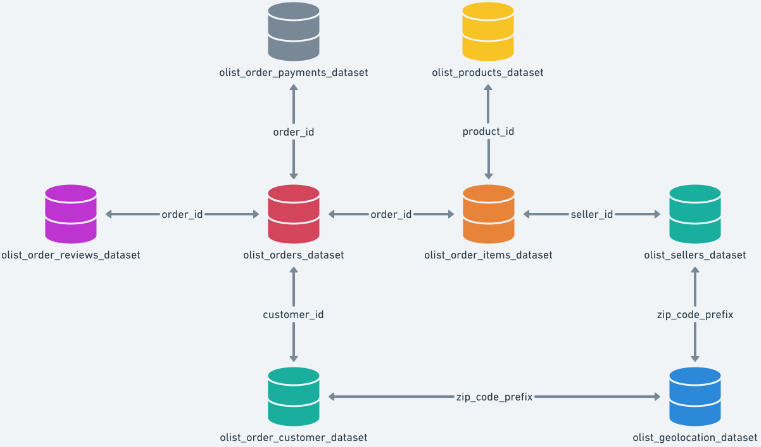

Let's Merge all datasets based on Data Schema

In [59]:
df = pd.merge(orders,order_payments, on="order_id")       # merging orders and orders payment dataset
df = df.merge(customers, on="customer_id")               # merging customers dataset
df = df.merge(order_items, on="order_id")                # merging order_items dataset
df = df.merge(products, on="product_id")                 # merging products data
df = df.merge(products_translation, on="product_category_name")     # merging products_translation dataset
df = df.merge(order_reviews, on="order_id")                         # merging order reviews dataset
df.head()           # visualising first five rows of merged dataset

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,quantity,product_id,seller_id,shipping_limit_date,price,freight_value,sale,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,review_score,review_comment_message
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,credit_card,1,18.12,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,29.99,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,4,"Não testei o produto ainda, mas ele veio corre..."
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,3,voucher,1,2.00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,29.99,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,4,"Não testei o produto ainda, mas ele veio corre..."
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,2,voucher,1,18.59,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,29.99,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,4,"Não testei o produto ainda, mas ele veio corre..."
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,1,boleto,1,141.46,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,118.70,perfumaria,29.0,178.0,1.0,400.0,19.0,13.0,19.0,perfumery,4,Muito bom o produto.
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,1,credit_card,3,179.12,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,159.90,automotivo,46.0,232.0,1.0,420.0,24.0,19.0,21.0,auto,5,NaN


In [60]:
print("Number of rows after merging:",len(df))      # rows after merging data
print("Number of columns after merging:",len(df.columns))      # columns after merging data

Number of rows after merging: 115609
Number of columns after merging: 34


In [61]:
df.isnull().sum()               # checking null values in merged dataset, Since merging can lead to pop up of some null values

order_id                             0
customer_id                          0
order_status                         0
order_purchase_timestamp             0
order_approved_at                   14
order_delivered_carrier_date      1195
order_delivered_customer_date     2400
order_estimated_delivery_date        0
payment_sequential                   0
payment_type                         0
payment_installments                 0
payment_value                        0
customer_unique_id                   0
customer_zip_code_prefix             0
customer_city                        0
customer_state                       0
quantity                             0
product_id                           0
seller_id                            0
shipping_limit_date                  0
price                                0
freight_value                        0
sale                                 0
product_category_name                0
product_name_lenght                  0
product_description_lengh

There are some null values in some columns of merged dataset, Need to deal with these null values

Handling Missing values in Timestamps :

The order of different types of timestamps are shown below:
order_purchase_timestamp---order_approved_at---order_delivered_carrier_date---order_delivered_customer_date---order_estimated_delivery_date
Some more Timestamps containg missing values are order_approved_at, order_delivered_carrier_date, order_delivered_customer_date.

In [65]:
#Handling missing values
index = (df[df['order_delivered_customer_date'].isnull() == True].index.values)

df["order_approved_at"].fillna(df["order_purchase_timestamp"], inplace=True)
df["order_delivered_customer_date"].fillna(df["order_estimated_delivery_date"], inplace=True)

#dropping order delivery carrier date
df.drop(labels='order_delivered_carrier_date',axis=1,inplace=True)

In [66]:
# Handling missing values of numerical features
df['product_weight_g'].fillna(df['product_weight_g'].median(),inplace=True)
df['product_length_cm'].fillna(df['product_length_cm'].median(),inplace=True)
df['product_height_cm'].fillna(df['product_height_cm'].median(),inplace=True)
df['product_width_cm'].fillna(df['product_width_cm'].median(),inplace=True)

In [67]:
#Handling missing values of text column
print("Percentage of null reviews :",(df.review_comment_message.isnull().sum()/len(df))*100 ,"%")
# filling null value of review comments with no_review
df['review_comment_message'].fillna('nao_reveja',inplace=True)

Percentage of null reviews : 57.697065107387836 %


Merging of dataets may also lead to duplication of some rows, and these rows should get de-duplicated as these rows will add nothing crucial in data but leads to redundancy

In [69]:
dup_rows = df[df.duplicated(['order_id','customer_id','order_purchase_timestamp','order_delivered_customer_date','customer_unique_id','review_comment_message'])]
dup_rows.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,quantity,product_id,seller_id,shipping_limit_date,price,freight_value,sale,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,review_score,review_comment_message
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-10 21:25:13,2017-10-18 00:00:00,3,voucher,1,2.00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,29.99,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,4,"Não testei o produto ainda, mas ele veio corre..."
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-10 21:25:13,2017-10-18 00:00:00,2,voucher,1,18.59,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,29.99,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,4,"Não testei o produto ainda, mas ele veio corre..."
11,e69bfb5eb88e0ed6a785585b27e16dbf,31ad1d1b63eb9962463f764d4e6e0c9d,delivered,2017-07-29 11:55:02,2017-07-29 12:05:32,2017-08-16 17:14:30,2017-08-23 00:00:00,1,credit_card,1,8.34,299905e3934e9e181bfb2e164dd4b4f8,18075,sorocaba,SP,1,9a78fb9862b10749a117f7fc3c31f051,7c67e1448b00f6e969d365cea6b010ab,2017-08-11 12:05:32,149.99,19.77,149.99,moveis_escritorio,45.0,527.0,1.0,9750.0,42.0,41.0,42.0,office_furniture,5,nao_reveja
13,e6ce16cb79ec1d90b1da9085a6118aeb,494dded5b201313c64ed7f100595b95c,delivered,2017-05-16 19:41:10,2017-05-16 19:50:18,2017-05-29 11:18:31,2017-06-07 00:00:00,1,credit_card,1,259.06,f2a85dec752b8517b5e58a06ff3cd937,20780,rio de janeiro,RJ,2,08574b074924071f4e201e151b152b4e,001cca7ae9ae17fb1caed9dfb1094831,2017-05-22 19:50:18,99.00,30.53,198.00,ferramentas_jardim,36.0,450.0,1.0,9000.0,42.0,12.0,39.0,garden_tools,1,Aguardando retorno da loja
22,83018ec114eee8641c97e08f7b4e926f,7f8c8b9c2ae27bf3300f670c3d478be8,delivered,2017-10-26 15:54:26,2017-10-26 16:08:14,2017-11-08 22:22:00,2017-11-23 00:00:00,3,voucher,1,24.86,634f09f6075fe9032e6c19609ffe995a,44024,feira de santana,BA,1,c35498fbb4358837ae16850f50c3fd22,70a12e78e608ac31179aea7f8422044b,2017-11-01 16:07:35,76.00,16.97,76.00,telefonia,59.0,973.0,1.0,325.0,19.0,8.0,22.0,telephony,4,nao_reveja


In [70]:
#removing duplicate data entries
df= df.drop_duplicates(subset={'order_id','customer_id','order_purchase_timestamp','order_delivered_customer_date'}, keep='first', inplace=False)
df=df.reindex()         # reindexing after de duplication

In [71]:
print("Number of rows after dedublication:",len(df))
print("Number of columns after deduplication:",len(df.columns))

Number of rows after dedublication: 96516
Number of columns after deduplication: 33


In [72]:
# all time stamps are in object dtype as observed above converting it into dataetime 
df[['order_purchase_timestamp','order_approved_at','order_delivered_customer_date','order_estimated_delivery_date',]]=df[['order_purchase_timestamp',
       'order_approved_at','order_delivered_customer_date','order_estimated_delivery_date']].apply(pd.to_datetime)

In [73]:
# Adding Review Score column in the dataframe 
def partition(x):
    if x < 3:
        return 0
    return 1
df['review_score']=df['review_score'].map(lambda cw : partition(cw) ) 

# Exploratory Data Analysis

In [75]:
# creating some functions for visualizations
def format_spines(ax, right_border=True):
    # Setting up colors
    ax.spines['bottom'].set_color('#666666')
    ax.spines['left'].set_color('#666666')
    ax.spines['top'].set_visible(False)
    if right_border:
        ax.spines['right'].set_color('#FFFFFF')
    else:
        ax.spines['right'].set_color('#FFFFFF')
    ax.patch.set_facecolor('#FFFFFF')

def single_countplot(df, ax, x=None, y=None, top=None, order=True, hue=False, palette='virdis',
                     width=0.75, sub_width=0.5, sub_size=15):
    ncount = len(df)
    if x:
        col = x
    else:
        col = y

    if top is not None:
        cat_count = df[col].value_counts()
        top_categories = cat_count[:top].index
        df = df[df[col].isin(top_categories)]

    if hue != False:
        if order:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax, order=df[col].value_counts().index, hue=hue)
        else:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax, hue=hue)
    else:
        if order:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax, order=df[col].value_counts().index)
        else:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax)

    format_spines(ax, right_border=False)

    if x:
        for p in ax.patches:
            x = p.get_bbox().get_points()[:, 0]
            y = p.get_bbox().get_points()[1, 1]
            ax.annotate('{}\n{:.1f}%'.format(int(y), 100. * y / ncount), (x.mean(), y), ha='center', va='bottom')
    else:
        for p in ax.patches:
            x = p.get_bbox().get_points()[1, 0]
            y = p.get_bbox().get_points()[:, 1]
            ax.annotate('{} ({:.1f}%)'.format(int(x), 100. * x / ncount), (x, y.mean()), va='center')
    

def count_plot(feature, df, colors='Blues', hue=False, ax=None, title=''):
    
    # Preparing variables
    ncount = len(df)
    if hue != False:
        ax = sns.countplot(x=feature, data=df, palette=colors, hue=hue, ax=ax)
    else:
        ax = sns.countplot(x=feature, data=df, palette=colors, ax=ax)
        
    format_spines(ax)

    # Setting percentage
    for p in ax.patches:
        x=p.get_bbox().get_points()[:,0]
        y=p.get_bbox().get_points()[1,1]
        ax.annotate('{:.1f}%'.format(100.*y/ncount), (x.mean(), y), 
                ha='center', va='bottom') # set the alignment of the text
    
    # Final configuration
    if not hue:
        ax.set_title(df[feature].describe().name + ' Analysis', size=15, pad=20)
    else:
        ax.set_title(df[feature].describe().name + ' Analysis by ' + hue, size=15, pad=20)  
    if title != '':
        ax.set_title(title)       
    plt.tight_layout()
    
    
def bar_plot(x, y, df, colors='Blues', hue=False, ax=None, value=False, title=''):
    
    # Preparing variables
    try:
        ncount = sum(df[y])
    except:
        ncount = sum(df[x])
    #fig, ax = plt.subplots()
    if hue != False:
        ax = sns.barplot(x=x, y=y, data=df, palette=colors, hue=hue, ax=ax, ci=None)
    else:
        ax = sns.barplot(x=x, y=y, data=df, palette=colors, ax=ax, ci=None)

    # Setting borders
    format_spines(ax)

    # Setting percentage
    for p in ax.patches:
        xp=p.get_bbox().get_points()[:,0]
        yp=p.get_bbox().get_points()[1,1]
        if value:
            ax.annotate('{:.2f}k'.format(yp/1000), (xp.mean(), yp), 
                    ha='center', va='bottom') # set the alignment of the text
        else:
            ax.annotate('{:.1f}%'.format(100.*yp/ncount), (xp.mean(), yp), 
                    ha='center', va='bottom') # set the alignment of the text
    if not hue:
        ax.set_title(df[x].describe().name + ' Analysis', size=15, pad=20)
    else:
        ax.set_title(df[x].describe().name + ' Analysis by ' + hue, size=15, pad=20)
    if title != '':
        ax.set_title(title)  
    plt.tight_layout()

In [76]:
temp = pd.DataFrame(df.groupby('payment_type')['review_score'].agg(lambda x: x.eq(1).sum())).reset_index()
temp['total'] = list(pd.DataFrame(df.groupby('payment_type')['review_score'].agg([('total','count'),('Avg','mean')]))['total'])
temp['Avg']   = list(pd.DataFrame(df.groupby('payment_type')['review_score'].agg([('total','count'),('Avg','mean')]))['Avg'])
#sorting dataframe
temp = temp.sort_values(by=['total'], ascending=True)

### Payment Type Analysis 

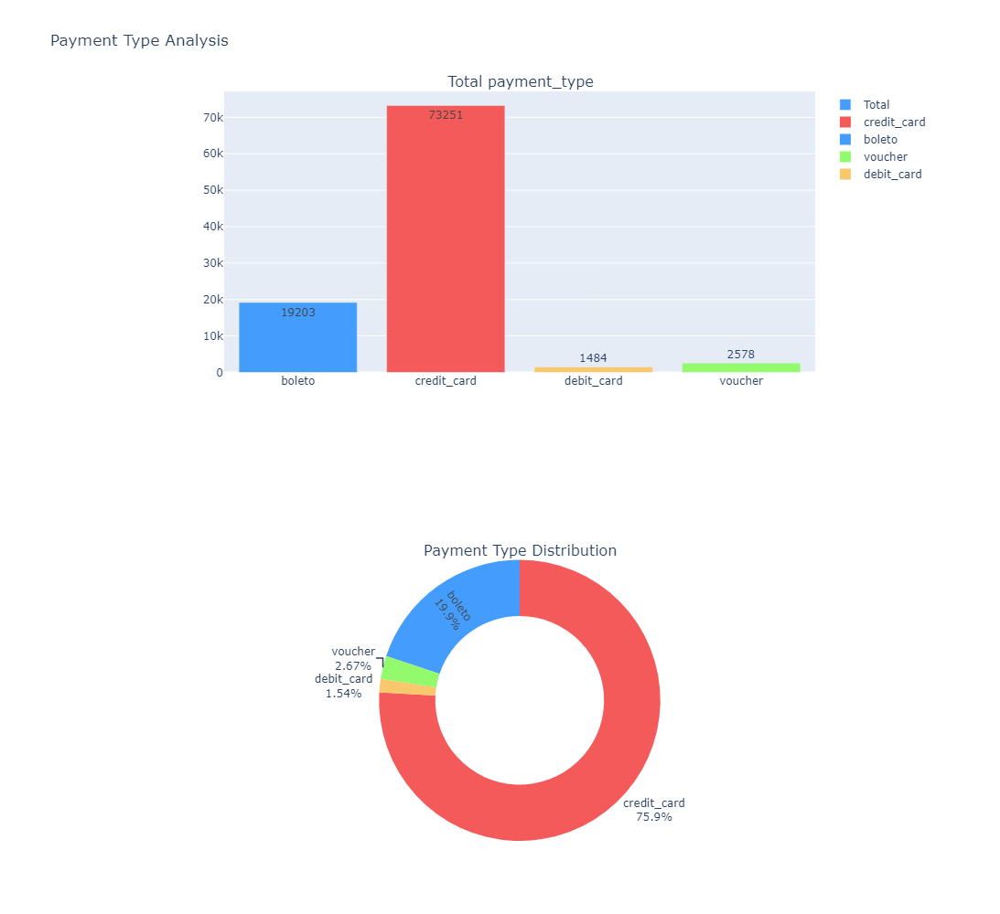

In [78]:
# Grouping by 'payment_type' and get the size of each group
payment_counts = df.groupby('payment_type').size()

# Extracting payment types and their counts
payment_types = payment_counts.index.tolist()
totals = payment_counts.values.tolist()

colors = {
    'credit_card': '#f45a5a',
    'boleto': '#449dfc',
    'voucher': '#93f96d',
    'debit_card': '#f9c86d'
}
color_values = [colors[ptype] for ptype in payment_types]


fig = make_subplots(
    rows=2, cols=1, 
    subplot_titles=("Total payment_type", "Payment Type Distribution"),
    specs=[[{"type": "xy"}], [{"type": "domain"}]]
)


fig.add_trace(
    go.Bar(
        x=payment_types,
        y=totals,
        marker=dict(color=color_values),
        text=totals,
        textposition='auto',
        name='Total'
    ),
    row=1, col=1
)

fig.add_trace(
    go.Pie(
        labels=payment_types,
        values=totals,
        marker=dict(colors=color_values),
        textinfo='label+percent',
        insidetextorientation='radial', hole = 0.6,
    ),
    row=2, col=1
)

# Updating layout
fig.update_layout(
    title_text="Payment Type Analysis",
    showlegend=True,
    height=1000,
    width=900
)

# Displaying the plot
fig.show()

from the above plots we can observe that most of the orders are paid using credit card and the second most used payment method is boleto.
The percentage of each mode of payment is shown in pie chart which shows amonst the all payments made by the user the credit card is used by 75.9% of the users, baleto is used by 19.9% of the user and 3.2% of the user used voucher and debit card.

In [80]:
#Simplifing the plots using pareto plots
def pareto_plot(df, x=None, y=None, title=None, show_pct_y=False, pct_format='{0:.0%}'):
    xlabel = x
    ylabel = y
    tmp = df.sort_values(y, ascending=False)
    x = tmp[x].values
    y = tmp[y].values
    weights = y / y.sum()
    cumsum = weights.cumsum()

    fig, ax1 = plt.subplots(figsize=(10,6))
    ax1.bar(x, y,color='#15F5BA',edgecolor='black',alpha=0.9)
    ax1.set_xlabel(xlabel)
    ax1.set_ylabel(ylabel)

    ax2 = ax1.twinx()
    ax2.plot(x, cumsum, '-ro', alpha=0.5,color='black')
    ax2.set_ylabel('', color='r')
    ax2.tick_params('y', colors='r')
    
    vals = ax2.get_yticks()
    ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])

    # hide y-labels on right side
    if not show_pct_y:
        ax2.set_yticks([])
    
    formatted_weights = [pct_format.format(x) for x in cumsum]
    for i, txt in enumerate(formatted_weights):
        ax2.annotate(txt, (x[i], cumsum[i]),fontsize=15)    
    
    if title:
        plt.title(title,color='black',fontsize=20)
    
    plt.tight_layout()
    plt.show()

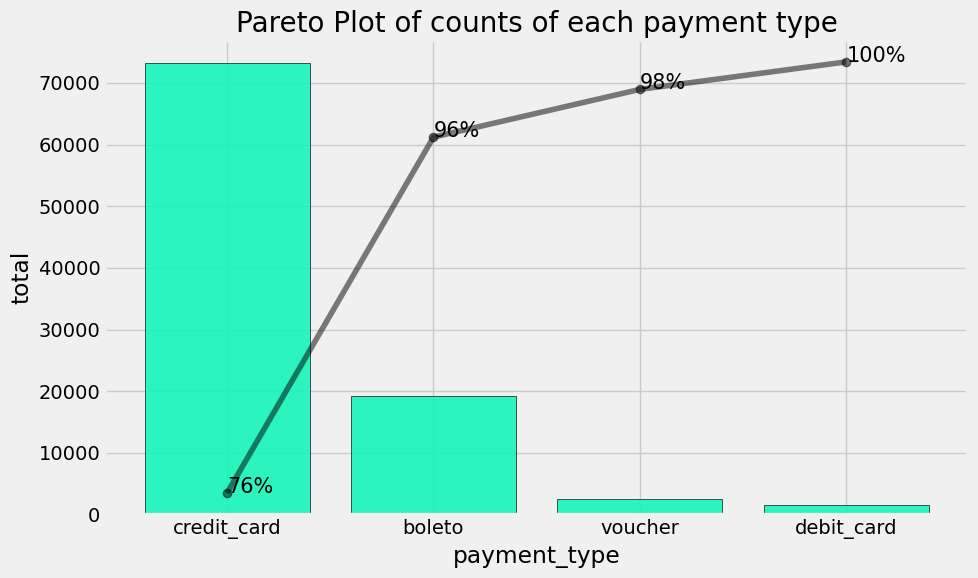

In [81]:
pareto_plot(temp,x='payment_type',y='total',title="Pareto Plot of counts of each payment type")

we can observe from the above plots that 96 % of the user used credit card and boleto.With credit card , boleto and voucher it covers 98% of users. Now let us see,how it is related with the target variable i.e review score.Or we can say 98% chance that the customer will use credit_card or boleto or voucher.

##### Total Orders on E-Commerce

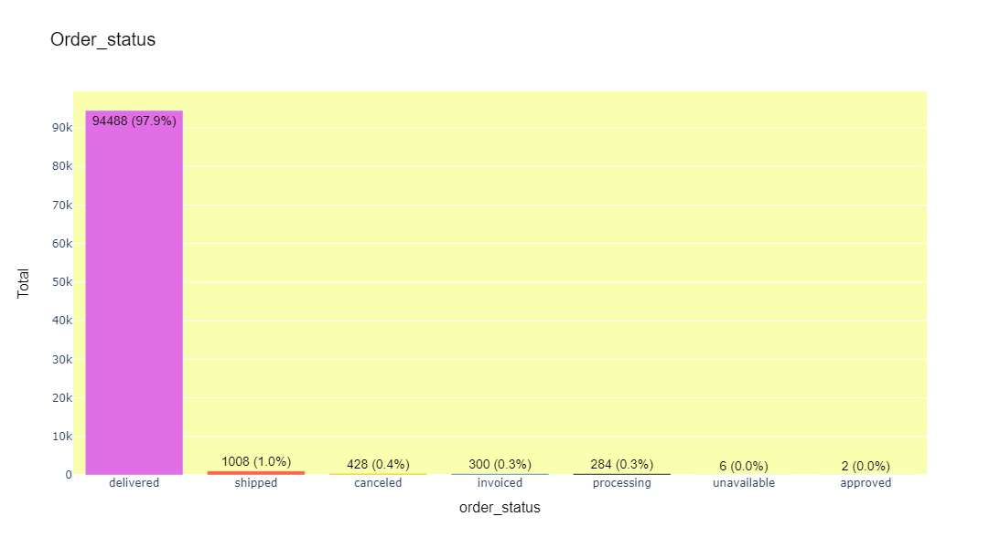

In [84]:

# Grouping by 'order_status' and get the size of each group
order_status_counts = df['order_status'].value_counts()

# Extracting order statuses and their counts
order_statuses = order_status_counts.index.tolist()
totals = order_status_counts.values.tolist()

colors = ['#E26EE5', '#FF6347', '#FFD700', '#4682B4']

fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=order_statuses,
        y=totals,
        marker=dict(color=colors),
        text=[f'{val} ({val / sum(totals) * 100:.1f}%)' for val in totals],
        textposition='auto',
        name='Total'
    )
)

fig.update_layout(
    title=dict(
        text="Order_status",
        font=dict(family="Arial", size=20, color="black")
    ),
    xaxis=dict(
        title=dict(
            text='order_status',
            font=dict(family="Arial", size=16, color="black")
        ),
        tickmode='array',
        tickvals=order_statuses,
        ticktext=order_statuses,
        showline=False
    ),
    yaxis=dict(
        title=dict(
            text='Total',
            font=dict(family="Arial", size=16, color="black")
        ),
        showline=False
    ),
    plot_bgcolor='#FAFFAF',
    showlegend=False,
    width=900,
    height=600
)

fig.update_traces(textfont=dict(family="Arial", size=14, color="black"))

fig.show()

This plot shows that 97.8% of the orders of status delivered and remaining precentage are with status shipped,canceled,invoiced,processing,unavailable and approved. The highest amount of orders went from delivered ones. Only 3% of all orders came from the other status.

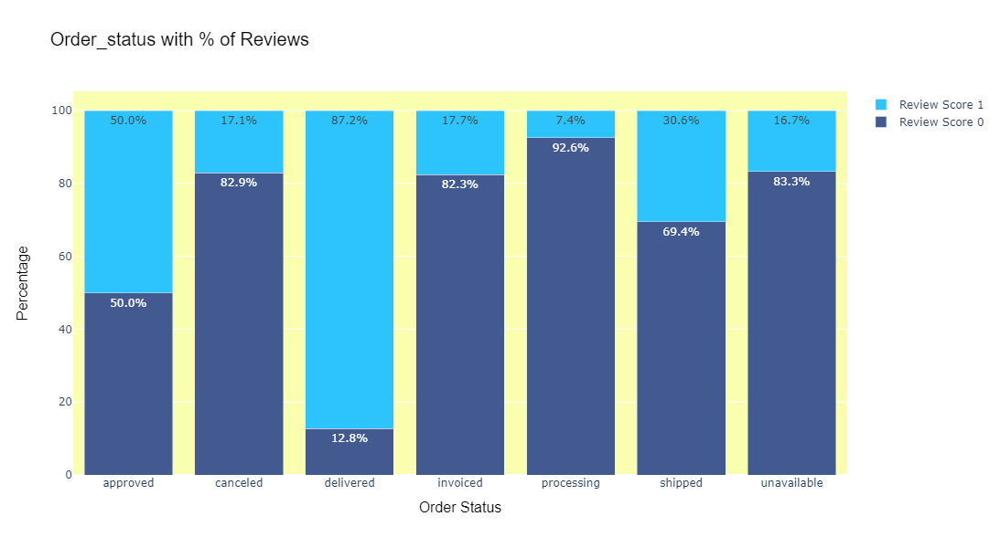

In [86]:
# Function to calculate percentage
def calculate_percentage(counts):
    total = sum(counts)
    return [(count / total) * 100 for count in counts]

# Grouping by 'order_status' and 'review_score' and get counts
grouped = df.groupby(['order_status', 'review_score']).size().unstack(fill_value=0)

# Calculating percentages for each review score category
grouped_percentages = grouped.apply(calculate_percentage, axis=1)

# Extracting order statuses and their percentages
order_statuses = grouped_percentages.index.tolist()
percentages = grouped_percentages.values.tolist()

colors = ['#425a90', '#2dc3fc']

fig = go.Figure()

for i, score in enumerate(grouped.columns):
    fig.add_trace(go.Bar(
        x=order_statuses,
        y=[percentages[j][i] for j in range(len(order_statuses))],
        name=f'Review Score {score}',
        marker_color=colors[i],
        text=[f'{percentages[j][i]:.1f}%' for j in range(len(order_statuses))],
        textposition='auto'
    ))

fig.update_layout(
    title=dict(
        text="Order_status with % of Reviews",
        font=dict(family="Arial", size=20, color="black")
    ),
    xaxis=dict(
        title=dict(
            text='Order Status',
            font=dict(family="Arial", size=16, color="black")
        ),
        showline=False
    ),
    yaxis=dict(
        title=dict(
            text='Percentage',
            font=dict(family="Arial", size=16, color="black")
        ),
        showline=False
    ),
    plot_bgcolor='#FAFFAF',
    barmode='stack',  # stack bars for each order status
    width=900,
    height=600
)

fig.show()

This plot shows that for the order_status delivered most of the order are with positive reviews i.e 85% and only 12.8% are negative reviews.

##### Evolution of Orders on E-Commerce 

In [89]:
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])
orders['order_delivered_customer_date'] = pd.to_datetime(orders['order_delivered_customer_date'])
orders['order_estimated_delivery_date'] = pd.to_datetime(orders['order_estimated_delivery_date'])

orders['year'] = orders['order_purchase_timestamp'].dt.year
orders['month'] = orders['order_purchase_timestamp'].dt.month
orders['month_name'] = orders['order_purchase_timestamp'].dt.strftime('%B')
orders['day'] = orders['order_purchase_timestamp'].dt.day
orders['day_of_week'] = orders['order_purchase_timestamp'].dt.dayofweek
orders['day_name'] = orders['order_purchase_timestamp'].dt.strftime('%A')
orders['hour'] = orders['order_purchase_timestamp'].dt.hour
orders['timeday'] = pd.cut(orders['order_purchase_timestamp'].dt.hour, bins=[0, 6, 12, 18, 24], labels=['Dawn', 'Morning', 'Afternoon', 'Night'])

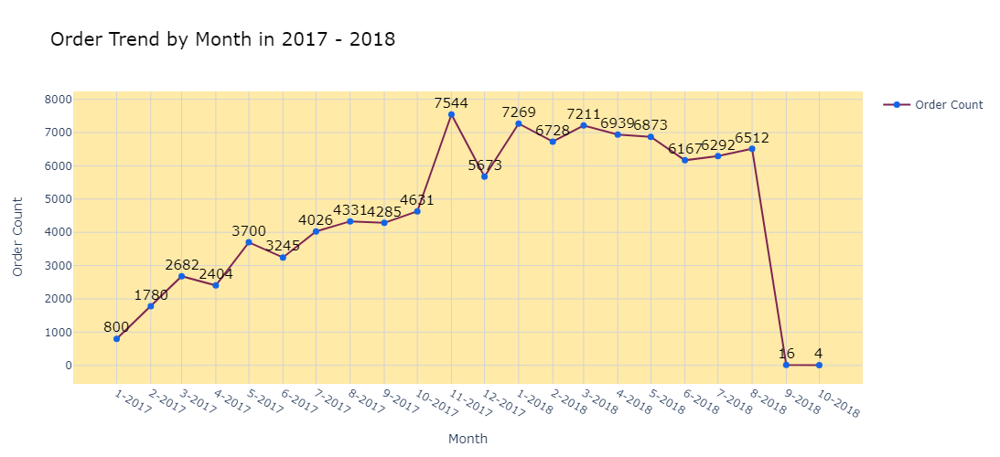

In [90]:
# Grouping by 'year' and 'month' to get the trend of order counts
trend = orders[orders['year'] != 2016].groupby(['year', 'month'])['order_id'].nunique().reset_index()

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=[f"{row['year']}-{row['month']:02}" for _, row in trend.iterrows()],
    y=trend['order_id'],
    mode='lines+markers',
    line=dict(color='#7E2553', width=2),
    marker=dict(symbol='circle', size=7, color='#1564e8'),
    name='Order Count'
))

# Adding annotations to the plot
highest = trend['order_id'].max() * 0.05  
for i, val in trend.iterrows():
    fig.add_annotation(
        x=f"{val['year']}-{val['month']:02}",
        y=val['order_id'] + highest,
        text=f"{round(val['order_id'], 2)}",
        showarrow=False,
        font=dict(size=15, color='black')
    )

# Updating layout for the plot
fig.update_layout(
    title='Order Trend by Month in 2017 - 2018',
    title_font=dict(size=20, color='black'),
    xaxis=dict(
        title='Month',
        tickmode='array',
        tickvals=[f"{row['year']}-{row['month']:02}" for _, row in trend.iterrows()],
        ticktext=[f"{row['month']}-{row['year']}" for _, row in trend.iterrows()],
        tickfont=dict(size=12),
        showgrid=True,  # Show gridlines
        gridcolor='#D3D3D3',  
        gridwidth=1,  
        zeroline=False,  
        showline=False 
    ),
    yaxis=dict(
        title='Order Count',
        tickfont=dict(size=12),
        showgrid=True,  # Show gridlines
        gridcolor='#D3D3D3',  
        gridwidth=1,  
        zeroline=False, 
        showline=False  
    ),
    plot_bgcolor='#FFEAA7',
    showlegend=True,
    width=1000,
    height=500
)

fig.show()

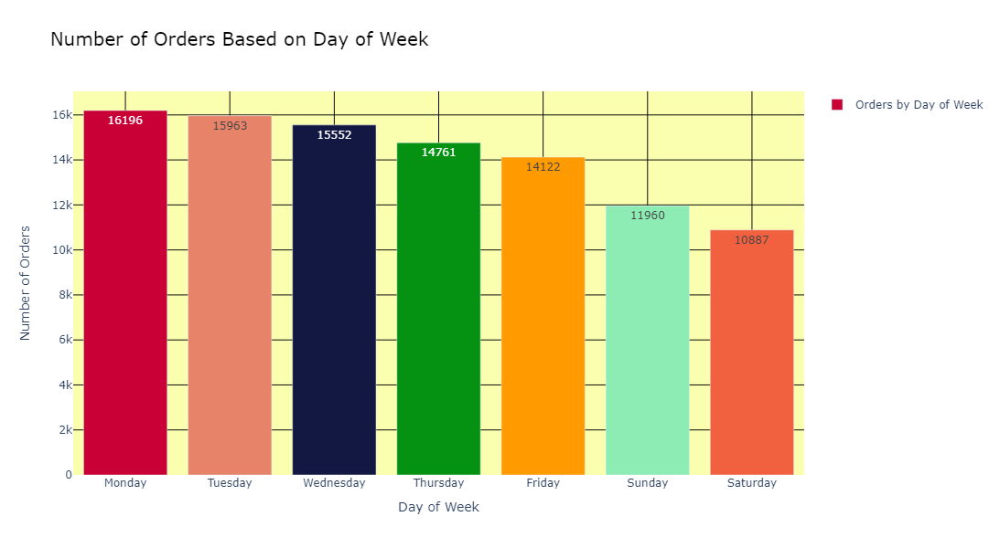

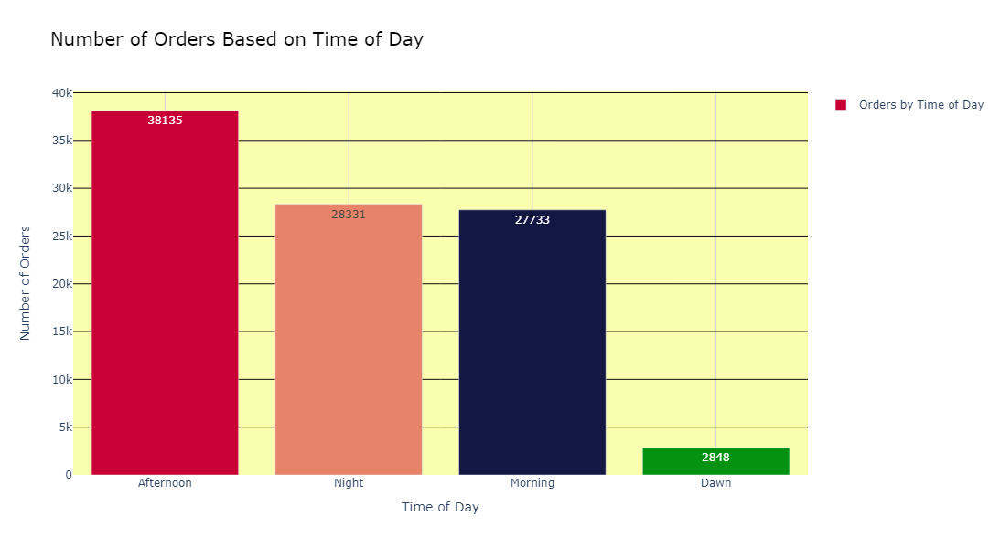

In [91]:
# Grouping by 'day_name' and 'timeday' to get the number of unique order ids
dayname = orders.groupby('day_name')['order_id'].nunique().sort_values(ascending=False)
timeday = orders.groupby('timeday')['order_id'].nunique().sort_values(ascending=False)

color_map1 = ['#131842', '#E68369', '#131842', '#059212', '#FF9A00', '#8DECB4', '#F2613F']
color_map2 = ['#131842', '#E68369', '#131842', '#059212']

color_map1[0] = '#C80036'  
color_map2[0] = '#C80036'  

fig1 = go.Figure()
fig2 = go.Figure()

# Adding bar trace for day_name
fig1.add_trace(go.Bar(
    x=dayname.index,
    y=dayname,
    marker=dict(color=color_map1),
    text=[f"{val}" for val in dayname],
    textposition='auto',
    name='Orders by Day of Week'
))

# Adding bar trace for timeday
fig2.add_trace(go.Bar(
    x=timeday.index,
    y=timeday,
    marker=dict(color=color_map2),
    text=[f"{val}" for val in timeday],
    textposition='auto',
    name='Orders by Time of Day'
))

# Updating layout for both plots
fig1.update_layout(
    title='Number of Orders Based on Day of Week',
    title_font=dict(size=20, color='black'),
    xaxis=dict(
        title='Day of Week',
        tickfont=dict(size=12),
        showgrid=True,  
        gridcolor='#0C0C0C',  
        gridwidth=1,  
        zeroline=False,  
        showline=False  
    ),
    yaxis=dict(
        title='Number of Orders',
        tickfont=dict(size=12),
        showgrid=True,  
        gridcolor='#0C0C0C',  
        gridwidth=1,  
        zeroline=False,  
        showline=False  
    ),
    plot_bgcolor='#FAFFAF',
    showlegend=True,
    width=900,
    height=600
)

fig2.update_layout(
    title='Number of Orders Based on Time of Day',
    title_font=dict(size=20, color='black'),
    xaxis=dict(
        title='Time of Day',
        tickfont=dict(size=12),
        showgrid=True,  
        gridcolor='#D3D3D3',  
        gridwidth=1,  
        zeroline=False,  
        showline=False  
    ),
    yaxis=dict(
        title='Number of Orders',
        tickfont=dict(size=12),
        showgrid=True,  
        gridcolor='#0C0C0C', 
        gridwidth=1,  
        zeroline=False,  
        showline=False  
    ),
    plot_bgcolor='#FAFFAF',
    showlegend=True,
    width=900,
    height=600
)

fig1.show()
fig2.show()

By the chart above we can conclude:

E-commerce on Brazil really has a growing trend along the time. We can see some seasonality with peaks at specific months, but in general we can see clear that customers are more prone to buy things online than before.
Monday are the prefered day for brazilian's customers and they tend to buy more at afternoons.

##### Impact Of E-Commerce 

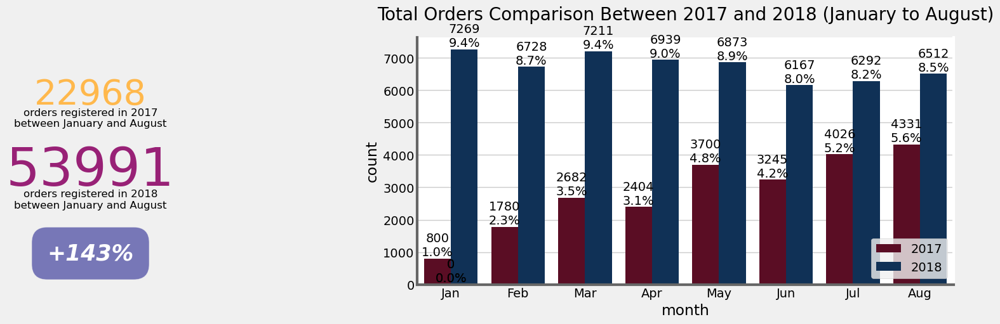

In [94]:
# Creating figure
fig = plt.figure(constrained_layout=True, figsize=(15, 5))

# Axis definition
gs = GridSpec(1, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1:])

# Annotation - Grown on e-commerce orders between 2017 and 2018
df_orders_compare = orders.query('year in (2017, 2018) & month <= 8')
year_orders = df_orders_compare['year'].value_counts()
growth = int(round(100 * (1 + year_orders[2017] / year_orders[2018]), 0))
ax1.text(0.00, 0.73, f'{year_orders[2017]}', fontsize=40, color='#FFB84C', ha='center')
ax1.text(0.00, 0.64, 'orders registered in 2017\nbetween January and August', fontsize=12, ha='center')
ax1.text(0.00, 0.40, f'{year_orders[2018]}', fontsize=60, color='#982176', ha='center')
ax1.text(0.00, 0.31, 'orders registered in 2018\nbetween January and August', fontsize=12, ha='center')
signal = '+' if growth > 0 else '-'
ax1.text(0.00, 0.10, f'{signal}{growth}%', fontsize=25, ha='center', color='white', style='italic', weight='bold',
         bbox=dict(facecolor='navy', alpha=0.5, pad=10, boxstyle='round, pad=.7'))
ax1.axis('off')

# Bar chart - Comparison between monthly sales between 2017 and 2018
single_countplot(df_orders_compare, x='month', hue='year', ax=ax2, order=False,
                 palette='RdBu')
month_label = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug']
ax2.set_xticklabels(month_label)
ax2.set_title('Total Orders Comparison Between 2017 and 2018 (January to August)', size=20, color='black', pad=20)
plt.legend(loc='lower right')
plt.show()

In [95]:
order_pay = orders.merge(order_payments, on='order_id', how='left')
order_pay = order_pay[(order_pay['order_status'] != 'canceled') & (order_pay['order_delivered_customer_date'].notna())]
a = order_pay.groupby(['year', 'month', 'payment_type'])['payment_value'].sum().reset_index()
a['year_month'] = a['year'].astype(str) + '-' + a['month'].astype(str)
b = order_pay.groupby(['year', 'month', 'payment_type'])['order_id'].nunique().reset_index()
b['year_month'] = b['year'].astype(str) + '-' + b['month'].astype(str)

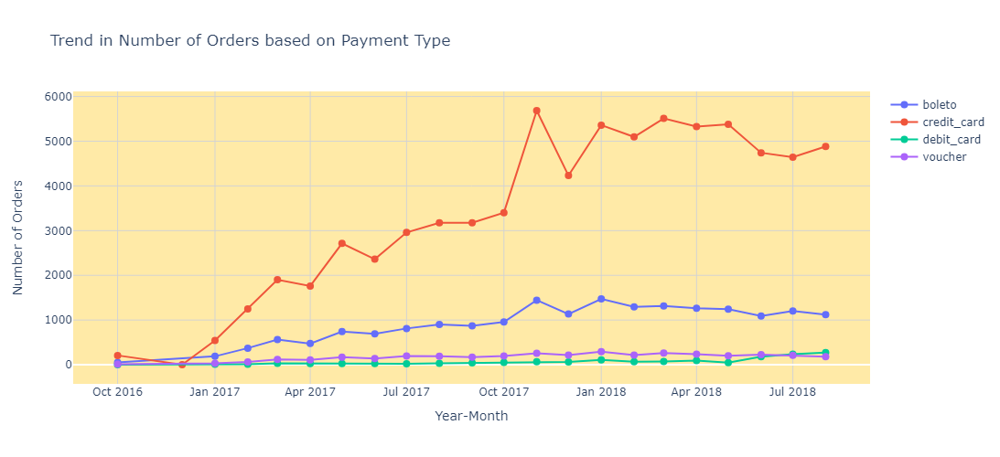

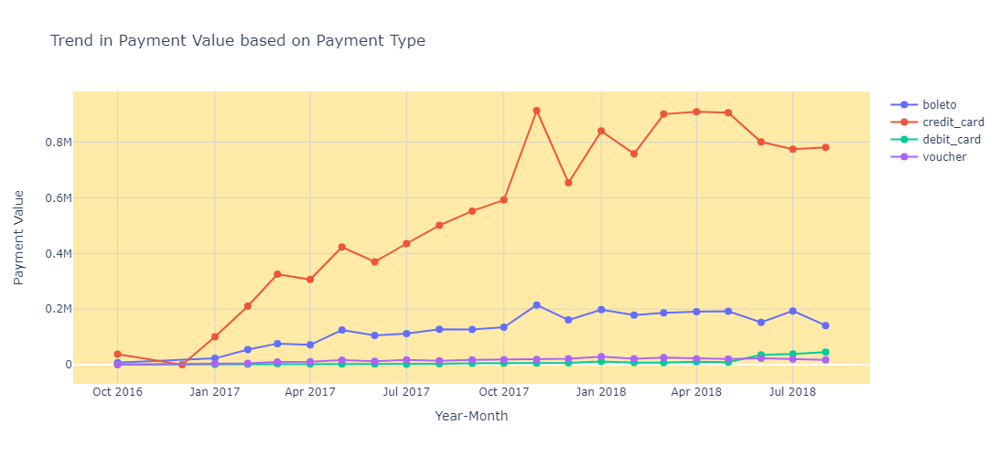

In [96]:
# Creating two separate figures 
fig_orders = go.Figure()
fig_payment = go.Figure()

# Adding line plots for number of orders based on payment type
for payment_type, data in b.groupby('payment_type'):
    fig_orders.add_trace(go.Scatter(
        x=data['year_month'],
        y=data['order_id'],
        mode='lines+markers',
        name=payment_type,
        line=dict(width=2),
        marker=dict(size=8),
    ))

# Adding line plots for payment value based on payment type
for payment_type, data in a.groupby('payment_type'):
    fig_payment.add_trace(go.Scatter(
        x=data['year_month'],
        y=data['payment_value'],
        mode='lines+markers',
        name=payment_type,
        line=dict(width=2),
        marker=dict(size=8),
    ))

# Updating layout for number of orders plot
fig_orders.update_layout(
    title='Trend in Number of Orders based on Payment Type',
    xaxis=dict(title='Year-Month', showgrid=True, gridcolor='#D3D3D3', gridwidth=1),
    yaxis=dict(title='Number of Orders', showgrid=True, gridcolor='#D3D3D3', gridwidth=1),
    plot_bgcolor='#FFEAA7',
    width=1000,
    height=500
)

# Updating layout for payment value plot
fig_payment.update_layout(
    title='Trend in Payment Value based on Payment Type',
    xaxis=dict(title='Year-Month', showgrid=True, gridcolor='#D3D3D3', gridwidth=1),
    yaxis=dict(title='Payment Value', showgrid=True, gridcolor='#D3D3D3', gridwidth=1),
    plot_bgcolor='#FFEAA7',
    width=1000,
    height=500
)

# Showing figures
fig_orders.show()
fig_payment.show()

##### E commerce Products and Revenue Analysis 

In [98]:
order_df = order_pay.merge(order_items.merge(products, on='product_id', how='left'), on='order_id', how='left')

best_selling_product = order_df.groupby('product_category_name').agg(num_orders = ('order_id','nunique'),revenue = ('payment_value', 'sum')).sort_values('num_orders', ascending=False)
                                

top_10 = best_selling_product.head(10)
bottom_10 = best_selling_product.tail(10).sort_values('num_orders', ascending=True)

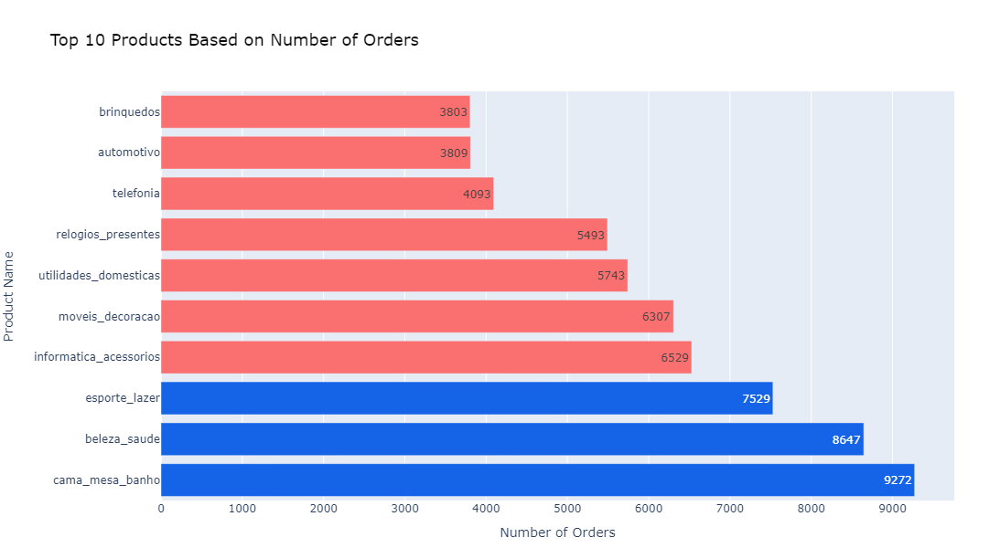

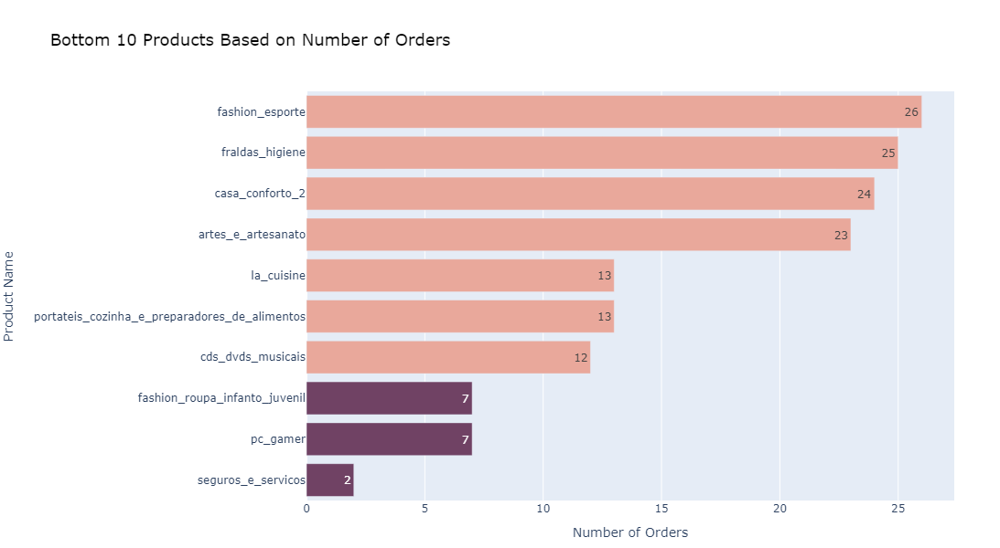

In [99]:
# Creating figure for Top 10 Products
fig_top = go.Figure()

fig_top.add_trace(go.Bar(
    y=top_10.index,
    x=top_10['num_orders'],
    orientation='h',
    marker=dict(color=['#1564e8' if i < 3 else '#FA7070' for i in range(len(top_10.index))]),
    text=top_10['num_orders'],
    textposition='auto',
    name='Top 10 Products'
))

fig_top.update_layout(
    title='Top 10 Products Based on Number of Orders',
    title_font=dict(size=18, color='black'),
    yaxis=dict(title='Product Name'),
    xaxis=dict(title='Number of Orders'),
    width=800,
    height=600,
    margin=dict(l=50, r=50, t=100, b=50),
)

# Creating figure for Bottom 10 Products
fig_bottom = go.Figure()

fig_bottom.add_trace(go.Bar(
    y=bottom_10.index,
    x=bottom_10['num_orders'],
    orientation='h',
    marker=dict(color=['#704264' if i < 3 else '#E9A89B' for i in range(len(bottom_10.index))]),
    text=bottom_10['num_orders'],
    textposition='auto',
    name='Bottom 10 Products'
))

fig_bottom.update_layout(
    title='Bottom 10 Products Based on Number of Orders',
    title_font=dict(size=18, color='black'),
    yaxis=dict(title='Product Name'),
    xaxis=dict(title='Number of Orders'),
    width=800,
    height=600,
    margin=dict(l=50, r=50, t=100, b=50),
)

fig_top.show()
fig_bottom.show()

In [100]:
best_revenue_product = order_df.groupby('product_category_name')\
                                .agg(num_orders = ('order_id','nunique'),
                                    revenue = ('payment_value', 'sum'))\
                                .sort_values('revenue', ascending=False)

top_10_rev = best_revenue_product.head(10)
bot_10_rev = best_revenue_product.tail(10).sort_values('revenue', ascending=True)

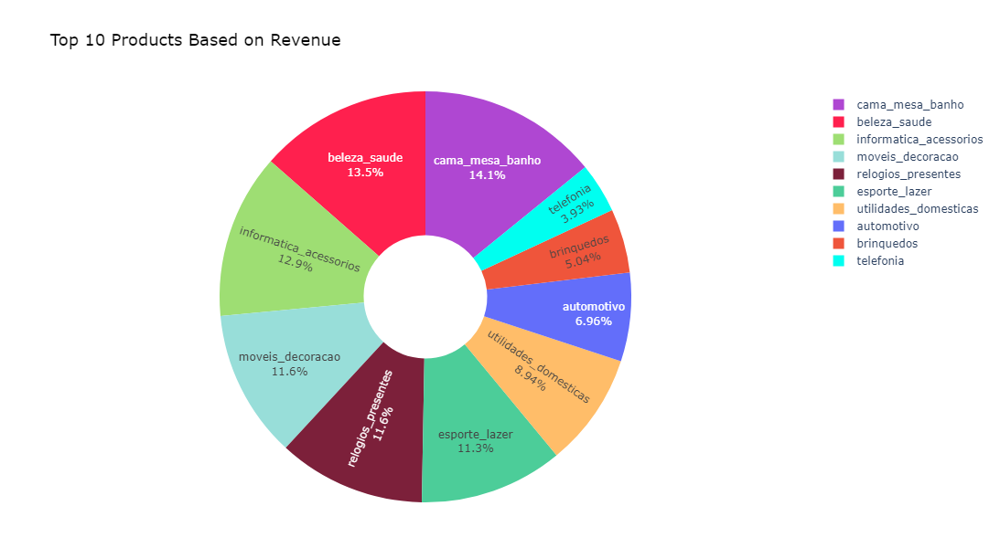

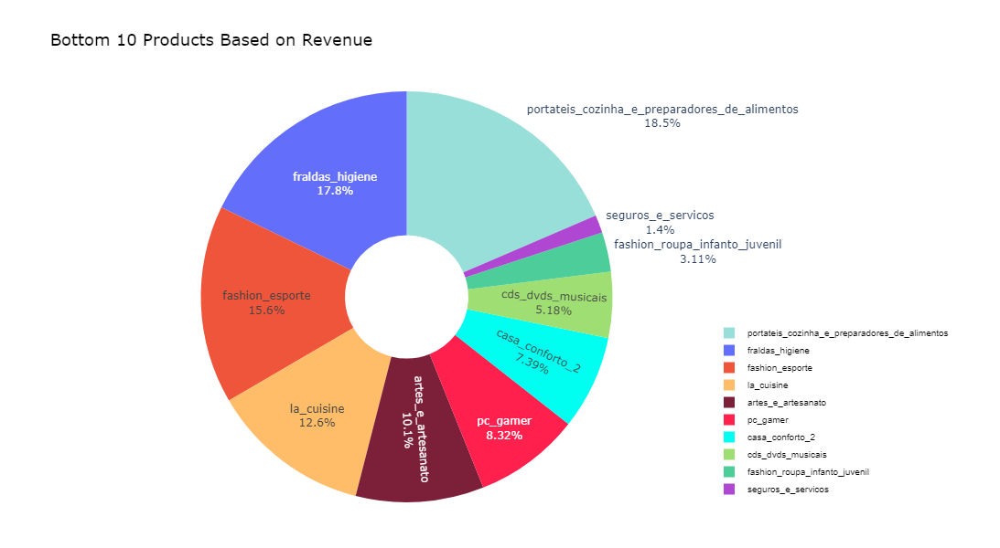

In [101]:
# Creating figure for Top 10 Products as Pie Chart
fig_top = go.Figure()

fig_top.add_trace(go.Pie(
    labels=top_10.index,
    values=top_10['revenue'],
    textinfo='label+percent',
    marker=dict(colors=['#AF47D2', '#FF204E', '#4CCD99', '#9EDE73', '#98DED9',
                        '#FFBD69', '#7C203A', '#00FFF0']),
    hole=0.3,
    name='Top 10 Products'
))

fig_top.update_layout(
    title='Top 10 Products Based on Revenue',
    title_font=dict(size=18, color='black'),
    width=800,
    height=600,
    margin=dict(l=50, r=50, t=100, b=50),
)

# Creating figure for Bottom 10 Products as Pie Chart
fig_bottom = go.Figure()

fig_bottom.add_trace(go.Pie(
    labels=bottom_10.index,
    values=bottom_10['revenue'],
    textinfo='label+percent',
    marker=dict(colors=['#AF47D2', '#FF204E', '#4CCD99', '#9EDE73', '#98DED9',
                        '#FFBD69', '#7C203A', '#00FFF0']),
    hole=0.3,
    name='Bottom 10 Products'
))

fig_bottom.update_layout(
    title='Bottom 10 Products Based on Revenue',
    title_font=dict(size=18, color='black'),
    width=800,
    height=600,
    margin=dict(l=50, r=50, t=100, b=50),
    legend=dict(
        x=1.0,
        y=0.0,
        traceorder='normal',
        font=dict(
            family='sans-serif',
            size=10,
            color='black'
        ),    )
)

fig_top.show()
fig_bottom.show()

In [102]:
order_df = order_df.merge(customers, on='customer_id', how='left').merge(sellers, on='seller_id', how='left')

top10_city = order_df.groupby('customer_city')\
                                .agg(num_orders = ('order_id','nunique'),
                                    revenue = ('payment_value', 'sum'))\
                                .sort_values('revenue', ascending=False).head(10)

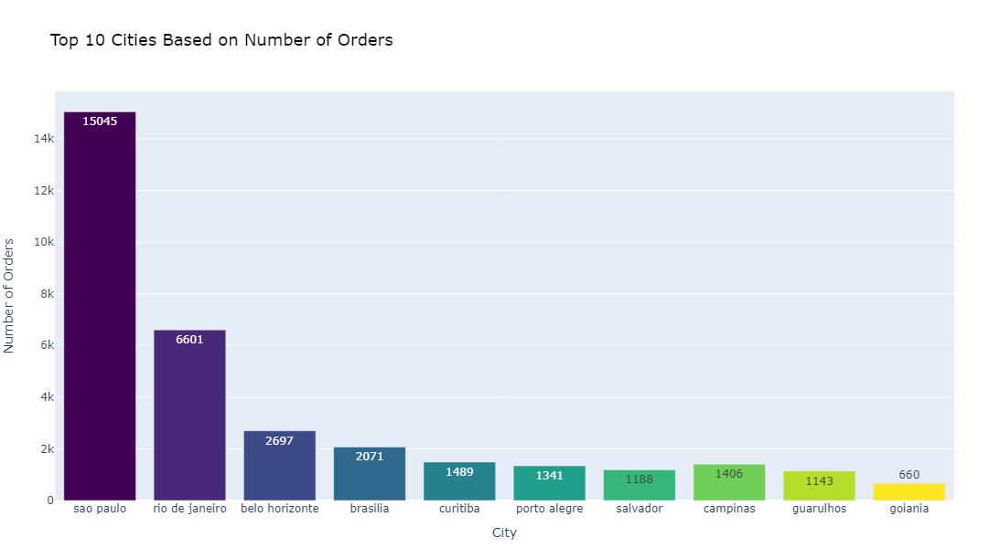

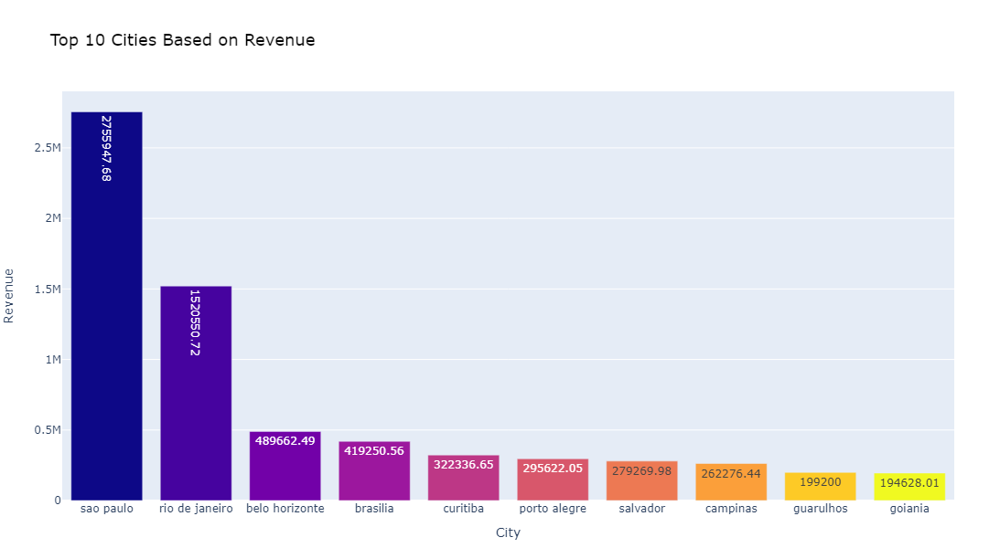

In [103]:
# Creating figure for Top 10 Products as Vertical Bar Plot (Number of Orders)
fig_top_orders = go.Figure()

fig_top_orders.add_trace(go.Bar(
    y=top10_city['num_orders'],
    x=top10_city.index,
    marker_color= px.colors.sequential.Viridis,
    text=top10_city['num_orders'],
    textposition='auto',
    name='Top 10 Products - Number of Orders'
))

fig_top_orders.update_layout(
    title='Top 10 Cities Based on Number of Orders',
    title_font=dict(size=18, color='black'),
    xaxis=dict(title='City'),
    yaxis=dict(title='Number of Orders'),
    width=800,
    height=600,
    margin=dict(l=50, r=50, t=100, b=50),
)

# Creating figure for Top 10 Products as Vertical Bar Plot (Revenue)
fig_top_revenue = go.Figure()

fig_top_revenue.add_trace(go.Bar(
    y=top10_city['revenue'],
    x=top10_city.index,
    marker_color= px.colors.sequential.Plasma,
    text=top10_city['revenue'],
    textposition='auto',
    name='Top 10 Products - Revenue'
))

fig_top_revenue.update_layout(
    title='Top 10 Cities Based on Revenue',
    title_font=dict(size=18, color='black'),
    xaxis=dict(title='City'),
    yaxis=dict(title='Revenue'),
    width=800,
    height=600,
    margin=dict(l=50, r=50, t=100, b=50),
)

fig_top_orders.show()
fig_top_revenue.show()

In [104]:
# creating delivery delay column
order_df['actual_delivery_time'] = (order_df['order_delivered_customer_date'] - order_df['order_purchase_timestamp']).dt.days
order_df['estimated_delivery_time'] = (order_df['order_estimated_delivery_date'] - order_df['order_purchase_timestamp']).dt.days
order_df['delivery_delay'] = order_df['actual_delivery_time'] - order_df['estimated_delivery_time']
order_df.head(3)

# Filtering out delivery_delay greater than zero
delayed_orders = order_df[order_df['delivery_delay'] > 0]

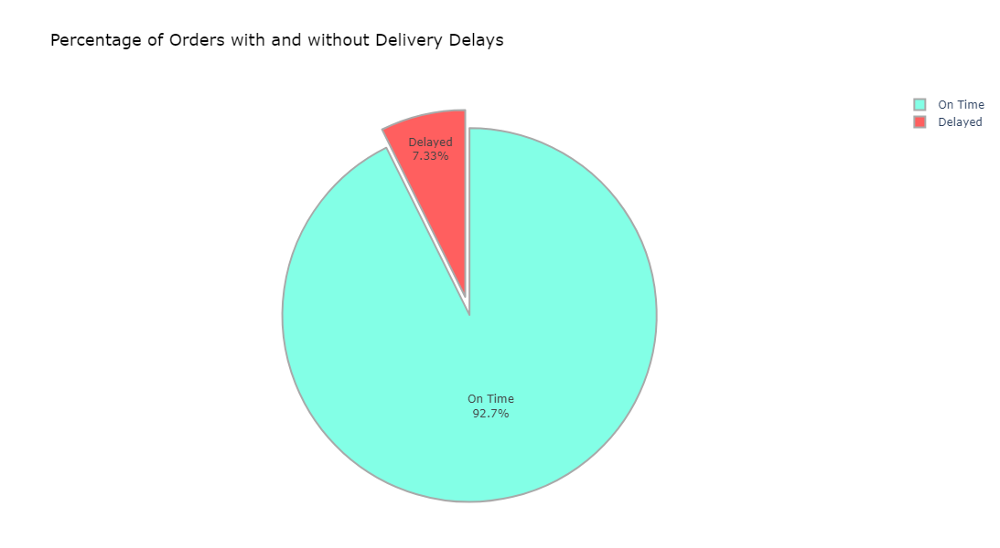

In [105]:
# Counting the number of orders that are delayed and on time
total_orders_with_delay = delayed_orders.shape[0]
total_orders_ontime = order_df.shape[0] - total_orders_with_delay

labels = ['On Time', 'Delayed']
sizes = [total_orders_ontime, total_orders_with_delay]
colors = ['#83FFE6', '#FF5F5F']
explode = (0.1, 0)

# Creating Pie chart figure
fig = go.Figure(data=[go.Pie(labels=labels, values=sizes, 
                             textinfo='label+percent', 
                             marker=dict(colors=colors, line=dict(color='darkgrey', width=2)),
                             pull=[0.1, 0])])

# Updating layout
fig.update_layout(
    title='Percentage of Orders with and without Delivery Delays',
    title_font=dict(size=18, color='black'),
    width=800,
    height=600,
    margin=dict(l=50, r=50, t=100, b=50),
)

# Showing plot
fig.show()

In [106]:
# calculating average delay days and their average weight by product_name
average_delay_per_category = delayed_orders.groupby('product_category_name').agg(avg_delay = ('delivery_delay', 'mean'),
                                          avg_weight = ('product_weight_g', 'mean'))\
                                      .sort_values('avg_delay', ascending=False).head(15)

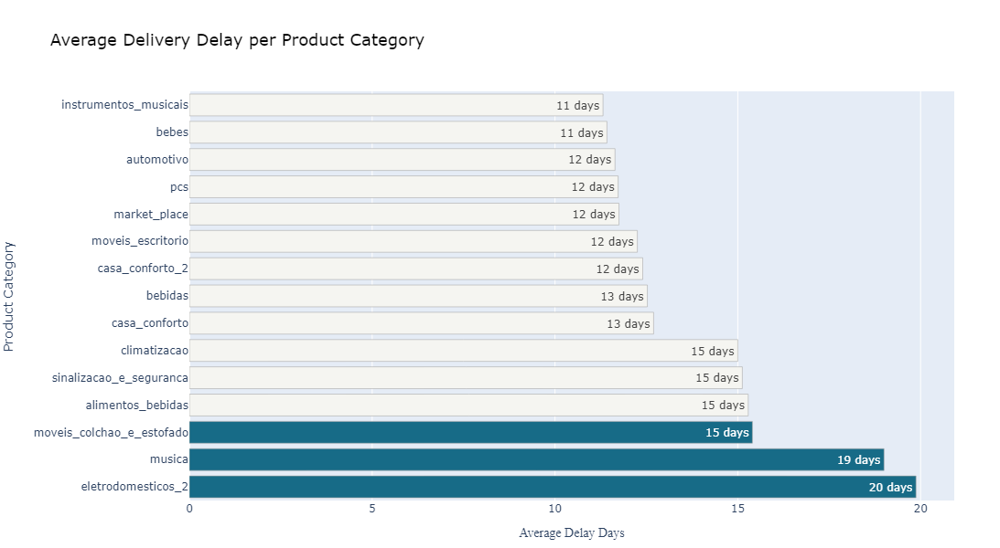

In [107]:
def format_annotation(val):
    # Custom formatting logic
    return f"{val:.0f} days"

color_map3 = ['#f5f5f1' for _ in range(15)]
color_map3[:3] = ['#176B87', '#176B87', '#176B87']

# Creating figure
fig = go.Figure()

# Adding bar trace
fig.add_trace(go.Bar(
    y=average_delay_per_category.index,
    x=average_delay_per_category['avg_delay'],
    orientation='h',
    marker=dict(color=color_map3, line=dict(color='darkgrey', width=0.6)),
    text=[format_annotation(val) for val in average_delay_per_category['avg_delay']],
#     textposition='auto',
    hoverinfo='text',
    name='Average Delay Days'
))


# Updating layout
fig.update_layout(
    title='Average Delivery Delay per Product Category',
    title_font=dict(size=18, color='black'),
    xaxis=dict(title='Average Delay Days', title_font=dict(family='serif')),
    yaxis=dict(title='Product Category'),
    width=800,
    height=600,
    margin=dict(l=50, r=50, t=100, b=50),
)

# Showing plot
fig.show()

# LTV Analysis

### Monthly Revenue

In [110]:
df1_ = order_payments.merge(order_items, on='order_id')
df2_ = df1_.merge(orders, on='order_id')
df_ = df2_.merge(customers, on='customer_id')
print(df_.shape)

(117601, 31)


In [111]:
# converting date columns to datetime
date_columns = ['shipping_limit_date', 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date']
for col in date_columns:
    df_[col] = pd.to_datetime(df_[col], format='%Y-%m-%d %H:%M:%S')

In [112]:
# cleaning up name columns
df_['customer_city'] = df_['customer_city'].str.title()
df_['payment_type'] = df_['payment_type'].str.replace('_', ' ').str.title()
# engineering new/essential columns
df_['delivery_against_estimated'] = (df_['order_estimated_delivery_date'] - df_['order_delivered_customer_date']).dt.days
df_['order_purchase_year'] = df_.order_purchase_timestamp.apply(lambda x: x.year)
df_['order_purchase_month'] = df_.order_purchase_timestamp.apply(lambda x: x.month)
df_['order_purchase_dayofweek'] = df_.order_purchase_timestamp.apply(lambda x: x.dayofweek)
df_['order_purchase_hour'] = df_.order_purchase_timestamp.apply(lambda x: x.hour)
df_['order_purchase_day'] = df_['order_purchase_dayofweek'].map({0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'})
df_['order_purchase_mon'] = df_.order_purchase_timestamp.apply(lambda x: x.month).map({1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'Jun',7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'})
# Changing the month attribute for correct ordenation
df_['month_year'] = df_['order_purchase_month'].astype(str).apply(lambda x: '0' + x if len(x) == 1 else x)
df_['month_year'] = df_['order_purchase_year'].astype(str) + '-' + df_['month_year'].astype(str)
#creating year month column
df_['month_y'] = df_['order_purchase_timestamp'].map(lambda date: 100*date.year + date.month)

In [113]:
# dropping missing values
df_.dropna(inplace=True)

In [114]:
df_ = df_.query("month_year != '2016-12' and month_year != '2016-10'")

In [115]:
#calculate Revenue for each row and create a new dataframe with YearMonth - Revenue columns
df_revenue = df_.groupby(['month_year'])['payment_value'].sum().reset_index()
df_revenue

,month_year,payment_value
0,2017-01,170468.03
1,2017-02,318676.83
2,2017-03,499775.69
3,2017-04,439346.39
4,2017-05,687580.10
5,2017-06,575674.40
6,2017-07,701689.54
7,2017-08,830757.99
8,2017-09,973725.01
9,2017-10,977806.33


In [116]:
#calculating for monthly revenie growth rate
# using pct_change() function to see monthly percentage change
df_revenue['MonthlyGrowth'] = df_revenue['payment_value'].pct_change()
df_revenue

,month_year,payment_value,MonthlyGrowth
0,2017-01,170468.03,NaN
1,2017-02,318676.83,0.869423
2,2017-03,499775.69,0.568284
3,2017-04,439346.39,-0.120913
4,2017-05,687580.10,0.565007
5,2017-06,575674.40,-0.162753
6,2017-07,701689.54,0.218900
7,2017-08,830757.99,0.183940
8,2017-09,973725.01,0.172092
9,2017-10,977806.33,0.004191


### Monthly Active Customers

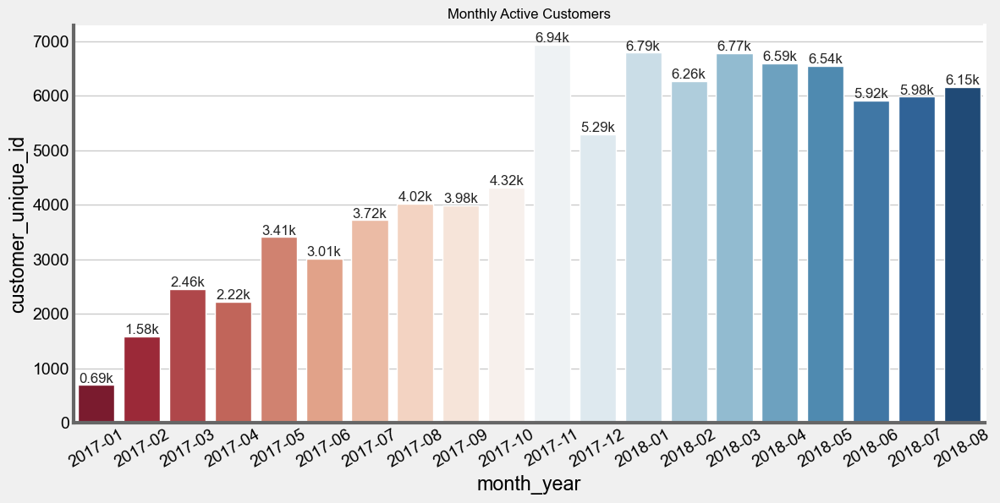

In [118]:
#creating monthly active customers dataframe by counting unique Customer IDs
df_monthly_active = df_.groupby('month_year')['customer_unique_id'].nunique().reset_index()

fig, ax = plt.subplots(figsize=(12, 6))
sns.set(palette='muted', color_codes=True, style='whitegrid')
bar_plot(x='month_year', y='customer_unique_id', df=df_monthly_active, value=True, colors = 'RdBu')
ax.tick_params(axis='x', labelrotation=30)
ax.set_title('Monthly Active Customers')
plt.show()

### Monthly Order Count

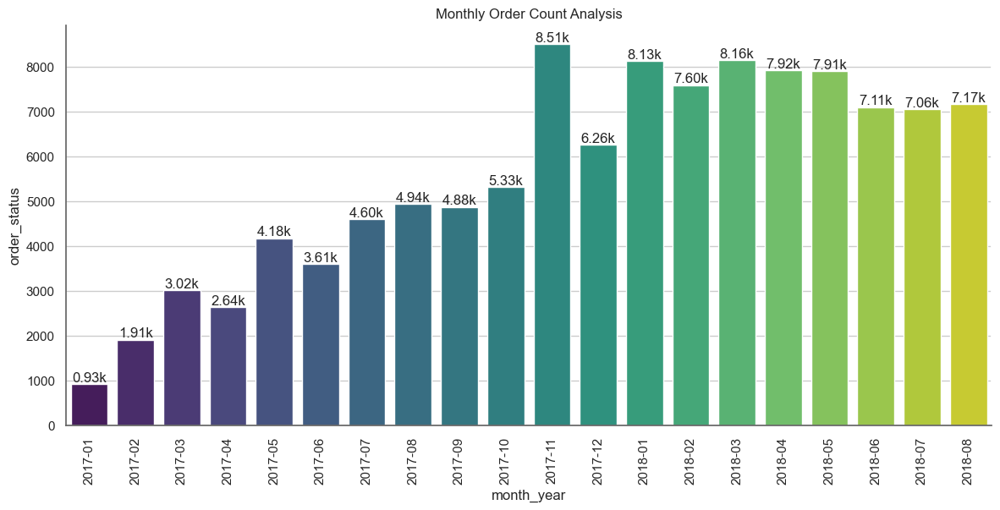

In [120]:
#creating monthly active customers dataframe by counting unique Customer IDs
df_monthly_sales = df_.groupby('month_year')['order_status'].count().reset_index()

fig, ax = plt.subplots(figsize=(12, 6))
sns.set(palette='muted', color_codes=True, style='whitegrid')
bar_plot(x='month_year', y='order_status', df=df_monthly_sales, value=True, colors = 'viridis')
ax.tick_params(axis='x', labelrotation=90)
ax.set_title('Monthly Order Count Analysis')
plt.show()

# Average Revenue per Customer Purchase

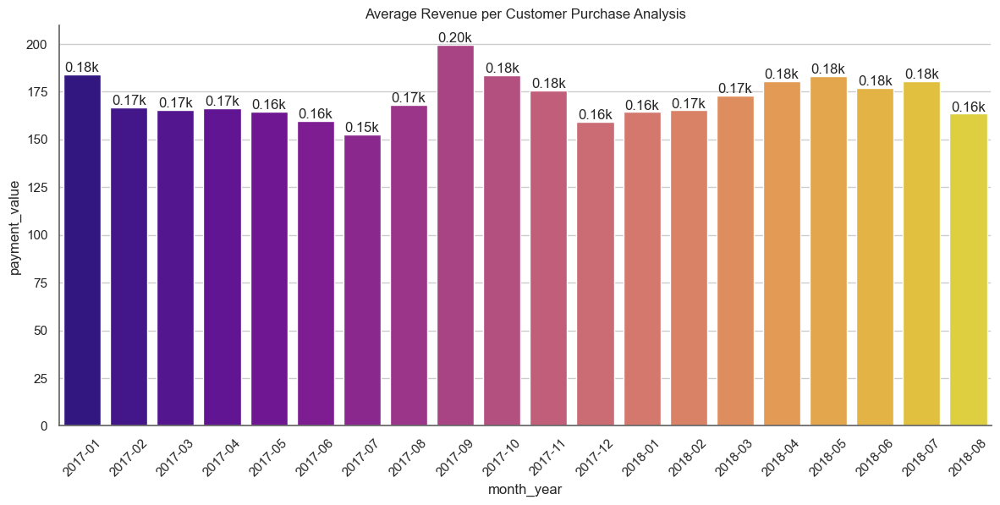

In [122]:
# creating a new dataframe for average revenue by taking the mean of it
df_monthly_order_avg = df_.groupby('month_year')['payment_value'].mean().reset_index()

fig, ax = plt.subplots(figsize=(12, 6))
sns.set(palette='muted', color_codes=True, style='whitegrid')
bar_plot(x='month_year', y='payment_value', df=df_monthly_order_avg, value=True, colors = 'plasma')
ax.tick_params(axis='x', labelrotation=45)
ax.set_title('Average Revenue per Customer Purchase Analysis')
plt.show()

### New Customer Ratio

In [124]:
#creating a dataframe contaning CustomerID and first purchase date
df_min_purchase = df_.groupby('customer_unique_id').order_purchase_timestamp.min().reset_index()
df_min_purchase.columns = ['customer_unique_id','minpurchasedate']
df_min_purchase['minpurchasedate'] = df_min_purchase['minpurchasedate'].map(lambda date: 100*date.year + date.month)

#merging first purchase date column to our main dataframe (tx_uk)
df_ = pd.merge(df_, df_min_purchase, on='customer_unique_id')

In [125]:
#create a column called User Type and assign Existing 
#if User's First Purchase Year Month before the selected Invoice Year Month
df_['usertype'] = 'New'
df_.loc[df_['month_y']>df_['minpurchasedate'],'usertype'] = 'Existing'

#calculate the Revenue per month for each user type
df_user_type_revenue = df_.groupby(['month_y','usertype', 'month_year'])['payment_value'].sum().reset_index()

df_user_type_revenue

,month_y,usertype,month_year,payment_value
0,201701,New,2017-01,170468.03
1,201702,Existing,2017-02,111.07
2,201702,New,2017-02,318565.76
3,201703,Existing,2017-03,596.38
4,201703,New,2017-03,499179.31
5,201704,Existing,2017-04,2677.76
6,201704,New,2017-04,436668.63
7,201705,Existing,2017-05,6733.95
8,201705,New,2017-05,680846.15
9,201706,Existing,2017-06,6250.15


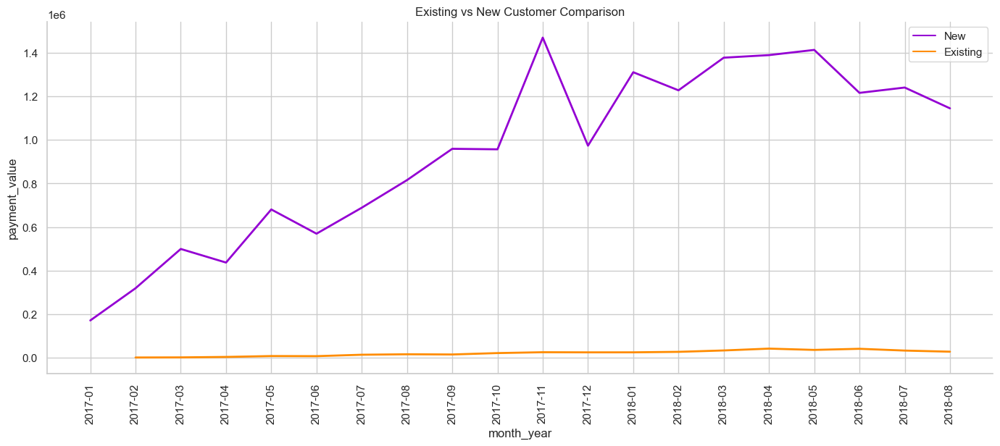

In [126]:
# Setting up the plot
fig, ax = plt.subplots(figsize=(15, 6))
sns.set_palette('muted')
sns.lineplot(x='month_year', y='payment_value', data=df_user_type_revenue.query("usertype == 'New'"), label='New', ax=ax, color='darkviolet')
sns.lineplot(x='month_year', y='payment_value', data=df_user_type_revenue.query("usertype == 'Existing'"), label='Existing', ax=ax, color='darkorange')

# Customizing the lines
lines = ax.lines
lines[0].set_linewidth(2)  
lines[1].set_linewidth(2)  

sns.despine(right=True)
ax.set_title('Existing vs New Customer Comparison')

ax.tick_params(axis='x', labelrotation=90)

# Show the plot
plt.show()

### New Customer Ratio

In [128]:
#creating a dataframe that shows new user ratio 
df_user_ratio = df_.query("usertype == 'New'").groupby(['month_year'])['customer_unique_id'].nunique()/df_.query("usertype == 'Existing'").groupby(['month_year'])['customer_unique_id'].nunique() 
df_user_ratio = df_user_ratio.reset_index()

#dropping nan values that resulted from first and last month
df_user_ratio = df_user_ratio.dropna()
df_user_ratio.columns = ['month_year','NewCusRatio']

#printing the dafaframe
df_user_ratio

,month_year,NewCusRatio
1,2017-02,789.500000
2,2017-03,490.400000
3,2017-04,129.352941
4,2017-05,120.642857
5,2017-06,87.617647
6,2017-07,83.454545
7,2017-08,70.839286
8,2017-09,50.740260
9,2017-10,49.788235
10,2017-11,58.810345


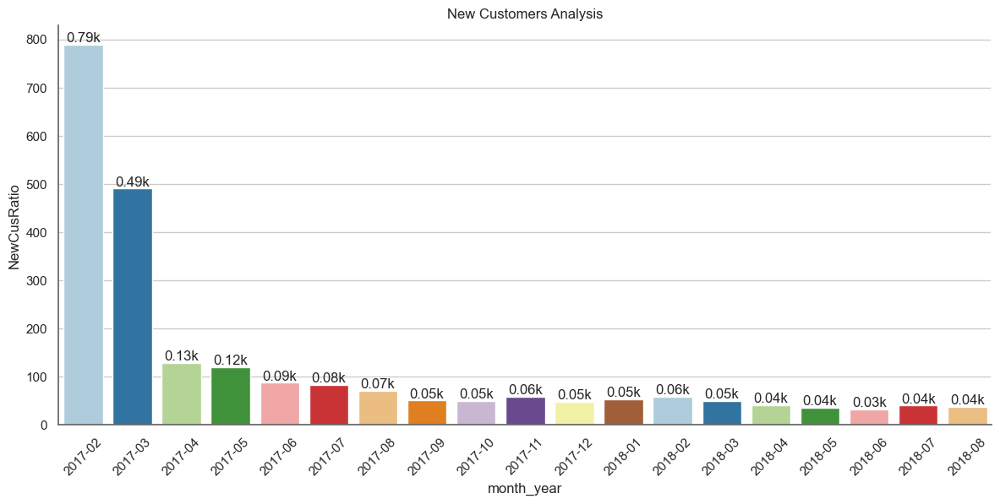

In [129]:
fig, ax = plt.subplots(figsize=(12, 6))
sns.set(palette='muted', color_codes=True, style='whitegrid')
bar_plot(x='month_year', y='NewCusRatio', df=df_user_ratio, value=True,colors = 'Paired')
ax.tick_params(axis='x', labelrotation=45)
ax.set_title('New Customers Analysis')
plt.show()

## Monthly Retention Rate

In [131]:
#Monthly Retention Rate = Retained Customers From Prev. Month/Active Customers Total (using crosstab)

#identifying active users are active by looking at their revenue per month
df_user_purchase = df_.groupby(['customer_unique_id','month_y'])['payment_value'].sum().reset_index()
df_user_purchase.head()

,customer_unique_id,month_y,payment_value
0,0000366f3b9a7992bf8c76cfdf3221e2,201805,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,201805,27.19
2,0000f46a3911fa3c0805444483337064,201703,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,201710,43.62
4,0004aac84e0df4da2b147fca70cf8255,201711,196.89


In [132]:
#creating retention matrix with crosstab using purchase
df_retention = pd.crosstab(df_user_purchase['customer_unique_id'], df_user_purchase['month_y']).reset_index()
df_retention.head()

month_y,customer_unique_id,201701,201702,201703,201704,201705,201706,201707,201708,201709,201710,201711,201712,201801,201802,201803,201804,201805,201806,201807,201808
0,0000366f3b9a7992bf8c76cfdf3221e2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,0000f46a3911fa3c0805444483337064,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0000f6ccb0745a6a4b88665a16c9f078,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,0004aac84e0df4da2b147fca70cf8255,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [133]:
#creating an array of dictionary which keeps Retained & Total User count for each month
months = df_retention.columns[2:]
retention_array = []
for i in range(len(months)-1):
    retention_data = {}
    selected_month = months[i+1]
    prev_month = months[i]
    retention_data['month_y'] = int(selected_month)
    retention_data['TotalUserCount'] = df_retention[selected_month].sum()
    retention_data['RetainedUserCount'] = df_retention[(df_retention[selected_month]>0) & (df_retention[prev_month]>0)][selected_month].sum()
    retention_array.append(retention_data)
    
#convert the array to dataframe and calculate Retention Rate
df_retention = pd.DataFrame(retention_array)
df_retention['RetentionRate'] = df_retention['RetainedUserCount']/df_retention['TotalUserCount']
df_retention['RetentionRate_percentage'] = df_retention['RetentionRate']*100
df_retention

,month_y,TotalUserCount,RetainedUserCount,RetentionRate,RetentionRate_percentage
0,201703,2457,3,0.001221,0.122100
1,201704,2216,11,0.004964,0.496390
2,201705,3406,14,0.004110,0.411039
3,201706,3013,13,0.004315,0.431464
4,201707,3716,16,0.004306,0.430571
5,201708,4023,23,0.005717,0.571713
6,201709,3984,31,0.007781,0.778112
7,201710,4317,30,0.006949,0.694927
8,201711,6938,37,0.005333,0.533295
9,201712,5293,39,0.007368,0.736822


In [134]:
df_retention

,month_y,TotalUserCount,RetainedUserCount,RetentionRate,RetentionRate_percentage
0,201703,2457,3,0.001221,0.122100
1,201704,2216,11,0.004964,0.496390
2,201705,3406,14,0.004110,0.411039
3,201706,3013,13,0.004315,0.431464
4,201707,3716,16,0.004306,0.430571
5,201708,4023,23,0.005717,0.571713
6,201709,3984,31,0.007781,0.778112
7,201710,4317,30,0.006949,0.694927
8,201711,6938,37,0.005333,0.533295
9,201712,5293,39,0.007368,0.736822


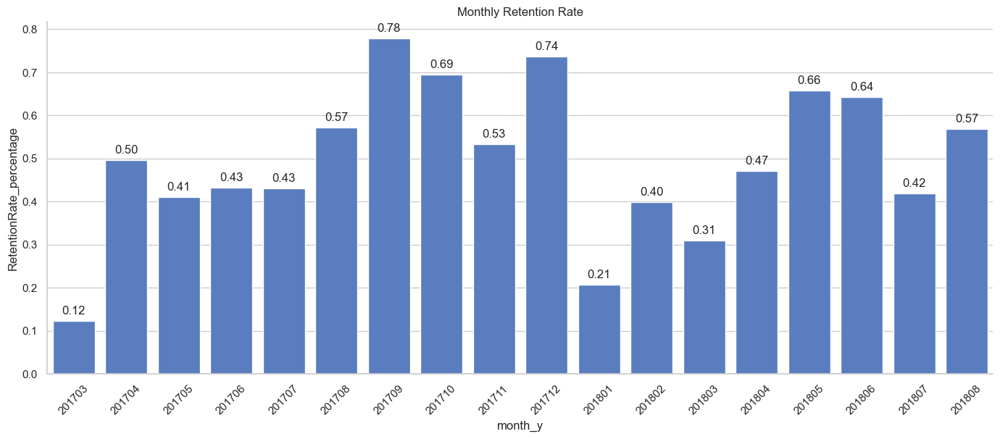

In [135]:
# Setting up the plot
fig, ax = plt.subplots(figsize=(15, 6))
sns.set_palette('muted')
sns.set_style('whitegrid')

# Creating the bar plot
barplot = sns.barplot(x='month_y', y='RetentionRate_percentage', data=df_retention, ax=ax)

ax.tick_params(axis='x', labelrotation=45)

ax.set_title('Monthly Retention Rate')

for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.2f'),
                     (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center',
                     xytext=(0, 10),
                     textcoords='offset points')

# Removing spines
sns.despine()

# Show the plot
plt.show()

# CLV Analysis

In [137]:
# Calculating total revenue for each order
df['total_price'] = df['price'] * df['quantity']

# Calculating Average Order Value (AOV) per customer
aov = df.groupby('customer_unique_id')['total_price'].mean().reset_index()
aov.columns = ['customer_unique_id', 'AOV']

# Calculating total number of orders per customer
total_orders = df.groupby('customer_unique_id')['order_id'].count().reset_index()
total_orders.columns = ['customer_unique_id', 'total_orders']

# Calculating total revenue per customer
total_revenue = df.groupby('customer_unique_id')['total_price'].sum().reset_index()
total_revenue.columns = ['customer_unique_id', 'total_revenue']

# Merging AOV, total_orders, and total_revenue
customer_data = pd.merge(aov, total_orders, on='customer_unique_id')
customer_data = pd.merge(customer_data, total_revenue, on='customer_unique_id')

# Calculating Purchase Frequency
purchase_frequency = total_orders['total_orders'].sum() / total_orders.shape[0]

# Calculating Customer Value
customer_data['customer_value'] = customer_data['AOV'] * purchase_frequency

# Calculating Customer Lifespan (assuming 2 years for simplicity)
customer_lifespan = 2  

# Calculating Customer Lifetime Value (CLV)
customer_data['CLV'] = customer_data['customer_value'] * customer_lifespan

# Displaying the first few rows of the CLV calculation
customer_data.head()


,customer_unique_id,AOV,total_orders,total_revenue,customer_value,CLV
0,0000366f3b9a7992bf8c76cfdf3221e2,129.90,1,129.90,134.239458,268.478916
1,0000b849f77a49e4a4ce2b2a4ca5be3f,18.90,1,18.90,19.531376,39.062752
2,0000f46a3911fa3c0805444483337064,69.00,1,69.00,71.305024,142.610048
3,0000f6ccb0745a6a4b88665a16c9f078,25.99,1,25.99,26.858226,53.716451
4,0004aac84e0df4da2b147fca70cf8255,180.00,1,180.00,186.013105,372.026211


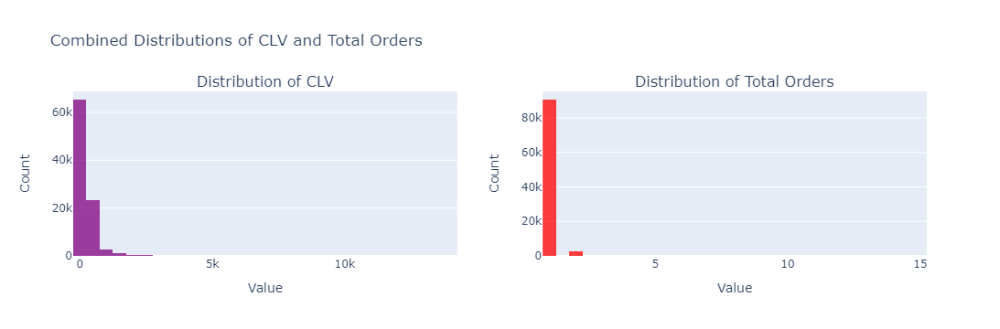

In [138]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Creating a subplot layout with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2, subplot_titles=('Distribution of CLV', 'Distribution of Total Orders'))

# Adding trace for CLV in the first column
fig.add_trace(
    go.Histogram(x=customer_data['CLV'], nbinsx=50, name='CLV', opacity=0.75, marker=dict(color='purple')),
    row=1, col=1
)

# Adding trace for Total Orders in the second column
fig.add_trace(
    go.Histogram(x=total_orders['total_orders'], nbinsx=50, name='Total Orders', opacity=0.75, marker=dict(color='red')),
    row=1, col=2
)

# Updating layout for the combined plot
fig.update_layout(
    title_text='Combined Distributions of CLV and Total Orders',
    showlegend=False,
    xaxis_title_text='Value',  
    xaxis2_title_text='Value',  
    yaxis_title_text='Count',  
    yaxis2_title_text='Count'  
)

# Showing the plot
fig.show()


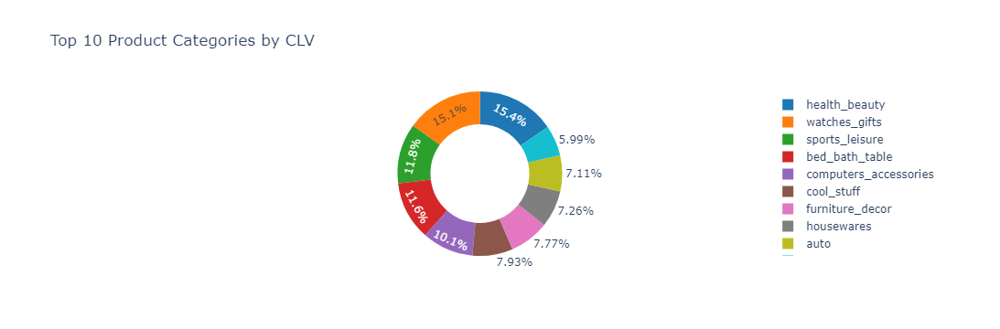

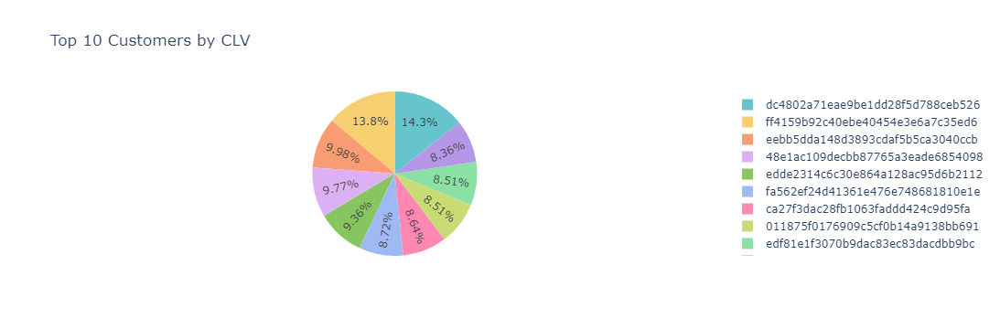

In [139]:
import plotly.express as px

# Top 10 Product Categories by Total Revenue
top_categories = df.groupby('product_category_name_english')['total_price'].sum().reset_index().nlargest(10, 'total_price')
fig3 = px.pie(top_categories, 
              names='product_category_name_english', hole = 0.6,
              values='total_price', 
              title='Top 10 Product Categories by CLV',
              color_discrete_sequence=px.colors.qualitative.D3)  
fig3.show()

# Top 10 Customers by CLV
top_customers = customer_data.nlargest(10, 'CLV')
fig6 = px.pie(top_customers, 
              names='customer_unique_id', 
              values='CLV', 
              title='Top 10 Customers by CLV',
              color_discrete_sequence=px.colors.qualitative.Pastel)  
fig6.show()


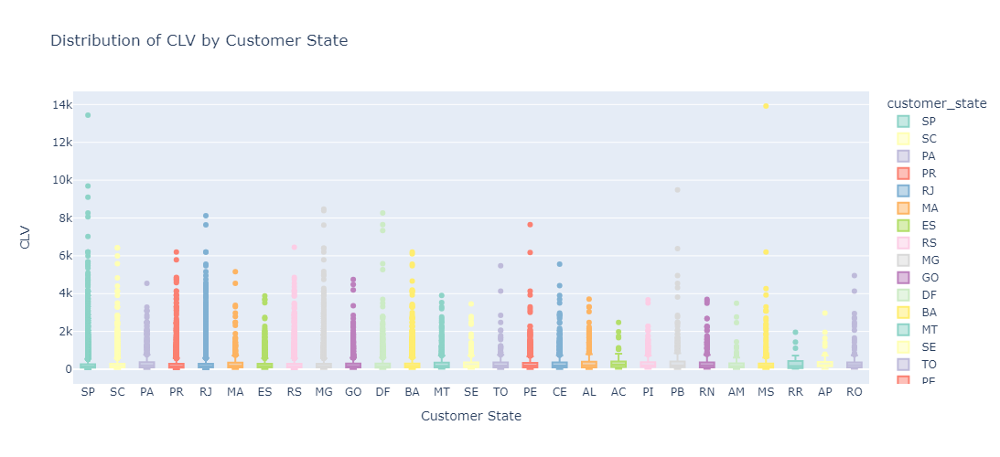

In [140]:
merged_data = customer_data.merge(df[['customer_unique_id', 'customer_state']].drop_duplicates(), on='customer_unique_id')

# Creating the box plot
fig2 = px.box(merged_data, 
              x='customer_state', 
              y='CLV', 
              title='Distribution of CLV by Customer State',
              color='customer_state',  
              color_discrete_sequence=px.colors.qualitative.Set3)  

# Customizing the layout
fig2.update_layout(
    height=500,  
    width=900,  
    xaxis_title='Customer State',
    yaxis_title='CLV',
    title={
        'text': 'Distribution of CLV by Customer State'
    }
)

# Showing the plot
fig2.show()


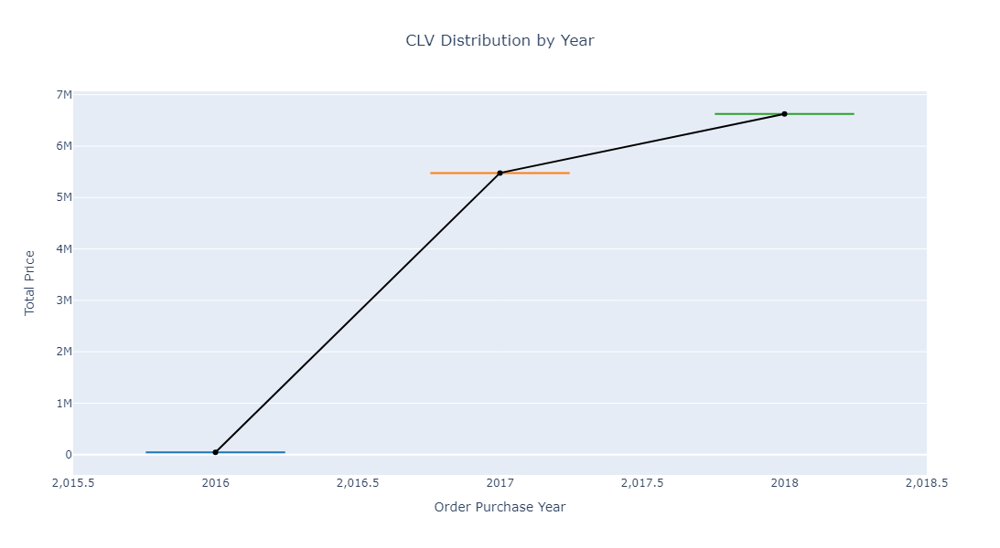

In [141]:
# Adding column for the year of purchase
df['order_purchase_year'] = df['order_purchase_timestamp'].dt.year

# Aggregating CLV by year
clv_by_year = df.groupby('order_purchase_year')['total_price'].sum().reset_index()

# Creating the box plot
fig5 = px.box(clv_by_year, x='order_purchase_year', y='total_price', title='CLV Distribution by Year',
              color='order_purchase_year',  # Different color for each year
              color_discrete_sequence=px.colors.qualitative.D3)  # Using a qualitative color palette

# Creating a line plot trace
line_trace = go.Scatter(
    x=clv_by_year['order_purchase_year'],
    y=clv_by_year['total_price'],
    mode='lines+markers',
    name='Total Price',
    line=dict(color='black')
)

# Combining the box plot and line plot into one figure
fig = go.Figure(data=list(fig5.data) + [line_trace])

# Customizing the layout
fig.update_layout(
    height=600,  
    width=1000,  
    xaxis_title='Order Purchase Year',
    yaxis_title='Total Price',
    title={
        'text': 'CLV Distribution by Year',
        'x': 0.5,  
        'xanchor': 'center'
    },
    showlegend=False  
)

# Showing the plot
fig.show()


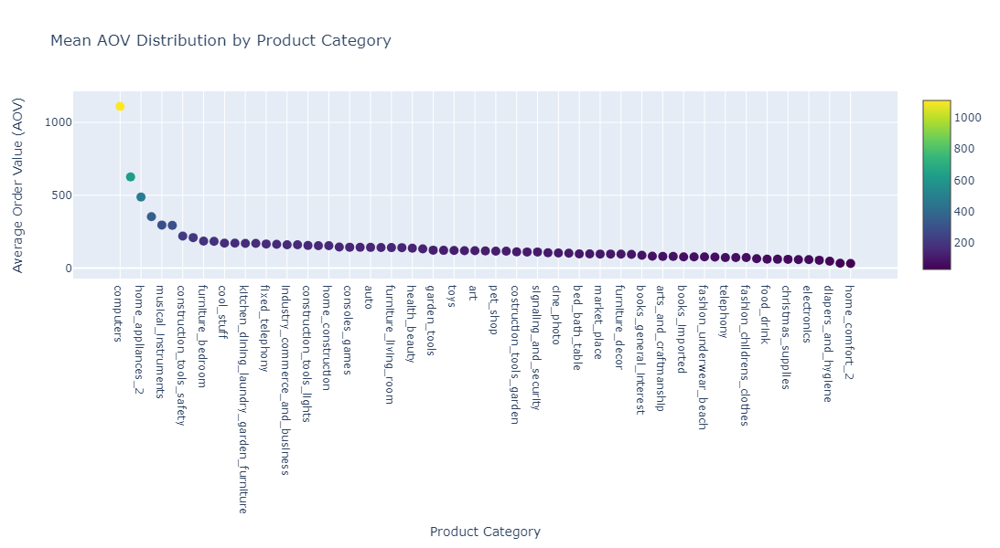

In [142]:

# Aggregating AOV by product category
aov_by_category = df.groupby('product_category_name_english')['total_price'].mean().reset_index()

# Creating the scatter plot trace
scatter_trace = go.Scatter(
    x=aov_by_category['product_category_name_english'],
    y=aov_by_category['total_price'],
    mode='markers',
    marker=dict(
        size=10,  
        color=aov_by_category['total_price'],  
        colorscale='Viridis',  
        showscale=True  
    ),
    line=dict(color='blue', width=2),  
    name='AOV'
)

fig7 = go.Figure(data=[scatter_trace])

# Customizing the layout
fig7.update_layout(
    title='Mean AOV Distribution by Product Category',
    xaxis_title='Product Category',
    yaxis_title='Average Order Value (AOV)',
    height=600,  
    width=1000,  
    xaxis={'categoryorder': 'total descending'}  
)

# Showing the plot
fig7.show()


# Data Preparation for Machine Learning

In [144]:
data = df.copy()         # copying merged data into data dataframe

In [145]:
# Since there are various columns having date time values thus changing it to datetime format
data['order_purchase_timestamp'] = pd.to_datetime(data['order_purchase_timestamp'])
data['order_delivered_customer_date'] = pd.to_datetime(data['order_delivered_customer_date'])
data['order_estimated_delivery_date'] = pd.to_datetime(data['order_estimated_delivery_date'])
data['year'] = data['order_purchase_timestamp'].dt.year
data['month'] = data['order_purchase_timestamp'].dt.month
data['month_name'] = data['order_purchase_timestamp'].dt.strftime('%B')
data['day'] = data['order_purchase_timestamp'].dt.day
data['day_of_week'] = data['order_purchase_timestamp'].dt.dayofweek
data['day_name'] = data['order_purchase_timestamp'].dt.strftime('%A')
data['hour'] = data['order_purchase_timestamp'].dt.hour
data['timeday'] = pd.cut(data['order_purchase_timestamp'].dt.hour, bins=[0, 6, 12, 18, 24], labels=['Dawn', 'Morning', 'Afternoon', 'Night'])
data['actual_delivery_time'] = (data['order_delivered_customer_date'] - data['order_purchase_timestamp']).dt.days
data['estimated_delivery_time'] = (data['order_estimated_delivery_date'] - data['order_purchase_timestamp']).dt.days
data['delivery_delay'] = data['actual_delivery_time'] - data['estimated_delivery_time']
data['delivery_delay'] = np.maximum(data['delivery_delay'], 0)
data.head(5)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,quantity,product_id,seller_id,shipping_limit_date,price,freight_value,sale,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,review_score,review_comment_message,total_price,order_purchase_year,year,month,month_name,day,day_of_week,day_name,hour,timeday,actual_delivery_time,estimated_delivery_time,delivery_delay
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-10 21:25:13,2017-10-18,1,credit_card,1,18.12,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,29.99,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares,1,"Não testei o produto ainda, mas ele veio corre...",29.99,2017,2017,10,October,2,0,Monday,10,Morning,8,15,0
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-08-07 15:27:45,2018-08-13,1,boleto,1,141.46,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,118.70,perfumaria,29.0,178.0,1.0,400.0,19.0,13.0,19.0,perfumery,1,Muito bom o produto.,118.70,2018,2018,7,July,24,1,Tuesday,20,Night,13,19,0
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-17 18:06:29,2018-09-04,1,credit_card,3,179.12,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,159.90,automotivo,46.0,232.0,1.0,420.0,24.0,19.0,21.0,auto,1,nao_reveja,159.90,2018,2018,8,August,8,2,Wednesday,8,Morning,9,26,0
5,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-12-02 00:28:42,2017-12-15,1,credit_card,1,72.20,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.00,27.20,45.00,pet_shop,59.0,468.0,3.0,450.0,30.0,10.0,20.0,pet_shop,1,O produto foi exatamente o que eu esperava e e...,45.00,2017,2017,11,November,18,5,Saturday,19,Night,13,26,0
6,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-16 18:17:02,2018-02-26,1,credit_card,1,28.62,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,2018-02-19 20:31:37,19.90,8.72,19.90,papelaria,38.0,316.0,4.0,250.0,51.0,15.0,15.0,stationery,1,nao_reveja,19.90,2018,2018,2,February,13,1,Tuesday,21,Night,2,12,0


Since there are various columns in the data which does not make any sense in terms of making prediction of sales

In [147]:
# selecting some columns which are more relevent for predicition purpose
selected_cols = ['order_status','payment_sequential','payment_type','payment_installments','payment_value','customer_city','customer_state','product_id','freight_value','sale',
                'product_name_lenght','product_description_lenght', 'product_photos_qty', 'product_weight_g','product_length_cm', 'product_height_cm', 'product_width_cm','product_category_name_english','review_score',
                 'year','month','day','day_of_week','hour','actual_delivery_time','estimated_delivery_time','delivery_delay']
final_data = data[selected_cols]
final_data.shape
final_data.to_csv('final_merged_dataset.csv')

In [148]:
final_data.isnull().sum()            # checking null values in the data

order_status                     0
payment_sequential               0
payment_type                     0
payment_installments             0
payment_value                    0
customer_city                    0
customer_state                   0
product_id                       0
freight_value                    0
sale                             0
product_name_lenght              0
product_description_lenght       0
product_photos_qty               0
product_weight_g                 0
product_length_cm                0
product_height_cm                0
product_width_cm                 0
product_category_name_english    0
review_score                     0
year                             0
month                            0
day                              0
day_of_week                      0
hour                             0
actual_delivery_time             0
estimated_delivery_time          0
delivery_delay                   0
dtype: int64

In [149]:
final_data.info()               # data type info of final_data columns

<class 'pandas.core.frame.DataFrame'>
Index: 96516 entries, 0 to 115608
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   order_status                   96516 non-null  object 
 1   payment_sequential             96516 non-null  int64  
 2   payment_type                   96516 non-null  object 
 3   payment_installments           96516 non-null  int64  
 4   payment_value                  96516 non-null  float64
 5   customer_city                  96516 non-null  object 
 6   customer_state                 96516 non-null  object 
 7   product_id                     96516 non-null  object 
 8   freight_value                  96516 non-null  float64
 9   sale                           96516 non-null  float64
 10  product_name_lenght            96516 non-null  float64
 11  product_description_lenght     96516 non-null  float64
 12  product_photos_qty             96516 non-null  flo

In [150]:
final_data.describe()          # statistical description of data

,payment_sequential,payment_installments,payment_value,freight_value,sale,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,review_score,year,month,day,day_of_week,hour,actual_delivery_time,estimated_delivery_time,delivery_delay
count,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000,96516.000000
mean,1.022545,2.919858,157.924421,20.234453,125.867345,48.846409,794.035403,2.250663,2106.230884,30.152690,16.508465,23.064860,0.858873,2017.543827,6.031404,15.515873,2.756921,14.776327,12.321998,23.409559,0.730086
std,0.247935,2.711997,216.773702,15.936528,189.710170,9.998403,654.646798,1.747789,3766.818934,16.156705,13.345196,11.749239,0.348154,0.504362,3.221524,8.665201,1.966845,5.324920,9.687300,8.839450,4.591347
min,1.000000,0.000000,0.010000,0.000000,0.850000,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000,0.000000,2016.000000,1.000000,1.000000,0.000000,0.000000,0.000000,2.000000,0.000000
25%,1.000000,1.000000,60.065000,13.330000,41.900000,42.000000,349.000000,1.000000,300.000000,18.000000,8.000000,15.000000,1.000000,2017.000000,3.000000,8.000000,1.000000,11.000000,6.000000,18.000000,0.000000
50%,1.000000,2.000000,103.190000,16.390000,79.000000,52.000000,607.000000,2.000000,700.000000,25.000000,13.000000,20.000000,1.000000,2018.000000,6.000000,15.000000,3.000000,15.000000,10.000000,23.000000,0.000000
75%,1.000000,4.000000,175.392500,21.280000,139.900000,57.000000,996.000000,3.000000,1813.000000,38.000000,20.000000,30.000000,1.000000,2018.000000,8.000000,23.000000,4.000000,19.000000,16.000000,28.000000,0.000000
max,27.000000,24.000000,13664.080000,409.680000,6735.000000,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000,1.000000,2018.000000,12.000000,31.000000,6.000000,23.000000,208.000000,155.000000,189.000000


In [151]:
#dropping sale column from data
target = final_data['sale']
final_data.drop(['sale'],inplace=True,axis=1)

In [152]:
#Converting categorical target column to required format i.e. [0] or [1]
from sklearn.preprocessing import LabelEncoder,MinMaxScaler,OneHotEncoder   # importing label encoder and min max scalar
label_enc = LabelEncoder()
final_data['order_status'] = label_enc.fit_transform(final_data['order_status'])
final_data['payment_type'] = label_enc.fit_transform(final_data['payment_type'])
final_data['customer_city'] = label_enc.fit_transform(final_data['customer_city'])
final_data['customer_state'] = label_enc.fit_transform(final_data['customer_state'])
final_data['product_id'] = label_enc.fit_transform(final_data['product_id'])
final_data['product_category_name_english'] = label_enc.fit_transform(final_data['product_category_name_english'])

In [153]:
#Scaling down features in range [0,1]
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(final_data)

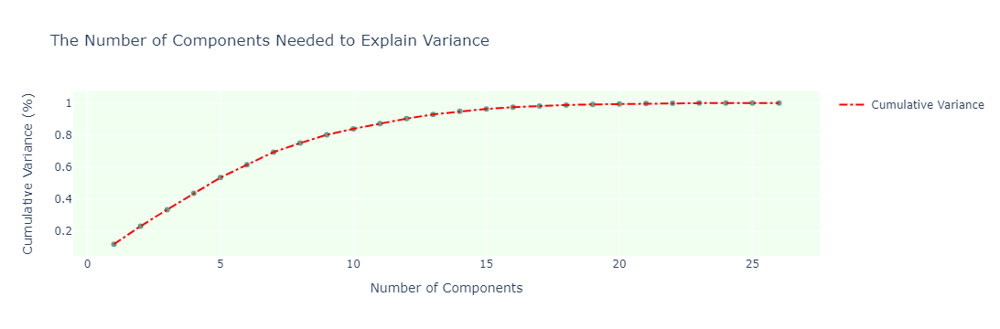

In [154]:
from sklearn.decomposition import PCA
pca = PCA().fit(scaled_data)
# Cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
df_plot = pd.DataFrame({'Number of Components': np.arange(1, len(cumulative_variance) + 1),
                        'Cumulative Variance': cumulative_variance})
fig = px.scatter(df_plot, x='Number of Components', y='Cumulative Variance',
                 title='The Number of Components Needed to Explain Variance',
                 labels={'Cumulative Variance': 'Cumulative Variance (%)'},
                 color_discrete_sequence=['rgba(0,100,80,0.6)'])
fig.add_trace(go.Scatter(x=df_plot['Number of Components'], y=df_plot['Cumulative Variance'],
                         mode='lines', name='Cumulative Variance',
                         line=dict(color='red', dash='dashdot')))


fig.update_layout(
    plot_bgcolor='honeydew',  
)
fig.show()

In [155]:
pca_comp = PCA(n_components = 15)
pc_data = pca_comp.fit_transform(scaled_data)   
print(np.sum(pca_comp.explained_variance_ratio_))

0.9634602305773631


# Implementing Machine Learning Models

In [170]:
from sklearn.ensemble import RandomForestRegressor       #importing ML models and some important Libaries
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_validate
import xgboost as xgb
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve,confusion_matrix,precision_score,recall_score,roc_auc_score,accuracy_score,classification_report
import tensorflow as tf
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [172]:
X_train, X_test, y_train, y_test = train_test_split(pc_data,target, test_size =0.2,random_state = 0,shuffle=True)   #splitting data into train and test

In [174]:
lr= LinearRegression()                   # initialisng linear regression model
lr.fit(X_train,y_train)             # fitting data into model for training

LinearRegression()

In [175]:
y_pred1 = lr.predict(X_test)                #making prediction on test data
mse_lr = mean_squared_error(y_pred1,y_test)
rmse_lr = mean_squared_error(y_pred1,y_test,squared=False)
mae_lr = mean_absolute_error(y_pred1,y_test)

print('MSE: ',mse_lr)
print('RMSE: ',rmse_lr)
print('MAE: ',mae_lr)

MSE:  32900.08445531477
RMSE:  181.38380428063243
MAE:  84.55678474771686


In [176]:
rf=RandomForestRegressor()            #initialisng random forest model
rf.fit(X_train,y_train)         # fitting data into model for training

RandomForestRegressor()

In [179]:
y_pred2 = rf.predict(X_test)          #predicting test data 
mse_rf = mean_squared_error(y_pred2,y_test)
rmse_rf = mean_squared_error(y_pred2,y_test,squared=False)
mae_rf = mean_absolute_error(y_pred2,y_test)

print('MSE: ',mse_rf)
print('RMSE: ',rmse_rf)
print('MAE: ',mae_rf)

MSE:  26181.653126097637
RMSE:  161.80745695454718
MAE:  70.15102652300038


In [180]:
xgb_reg = xgb.XGBRegressor()          #initialisng Xgboost model
xgb_reg.fit(X_train, y_train)            # fitting data into model for training

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [181]:
y_pred3 = xgb_reg.predict(X_test)          #predicting test data 
mse_xgb = mean_squared_error(y_pred3,y_test)
rmse_xgb = mean_squared_error(y_pred3,y_test,squared=False)
mae_xgb = mean_absolute_error(y_pred3,y_test)

print('MSE: ',mse_xgb)
print('RMSE: ',rmse_xgb)
print('MAE: ',mae_xgb)

MSE:  27196.531357843694
RMSE:  164.91370882326217
MAE:  75.2693484400465


# Comparative Analysis of Models

In [183]:
result_data = {'MAE':[mae_lr,mae_rf,mae_xgb], 
        'MSE':[mse_lr,mse_rf,mse_xgb],
        'RMSE':[rmse_lr,rmse_rf,rmse_xgb],
        'Algo':['Linear Regression','Random Forest','XGBOOST'] }
result_data = pd.DataFrame(result_data)    
result_data

,MAE,MSE,RMSE,Algo
0,84.556785,32900.084455,181.383804,Linear Regression
1,70.151027,26181.653126,161.807457,Random Forest
2,75.269348,27196.531358,164.913709,XGBOOST


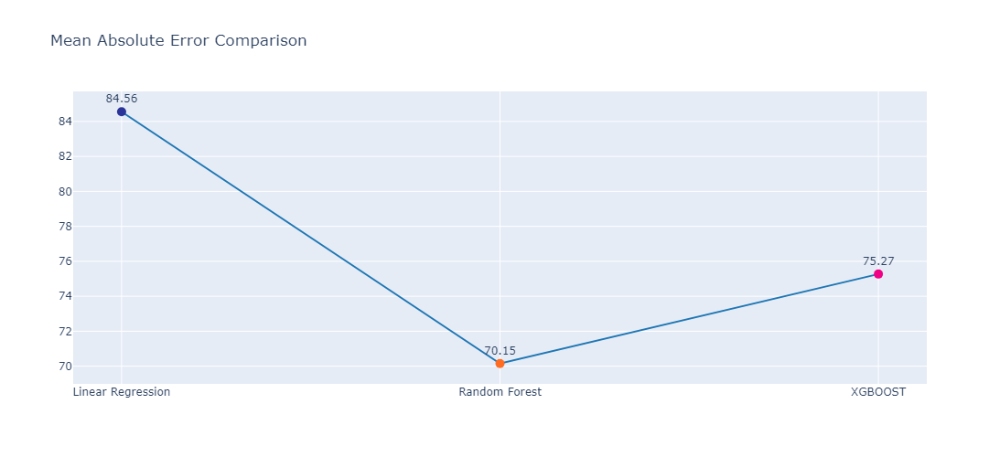

In [184]:
# plotting scatter line plot to comapre applied models based on Mean Absolute Error 
fig = go.Figure(data=go.Scatter(
    x=result_data['Algo'],
    y=result_data['MAE'],
    mode='lines+markers+text',
    marker=dict(
        color=['#2B3499','#FF6C22','#F10086','#64CCC5','#C70039','#91C483','#2B3499','#FF6C22','#F10086','#64CCC5','#C70039','#91C483'],
        size=10
    ),
    line=dict(
        color='#1f77b4',
        width=2
    ),
    text=result_data['MAE'],
    textposition='top center'
))

fig.update_layout(
    title_text="Mean Absolute Error Comparison",
    height=500,
    width=1000
)

fig.update_traces(texttemplate='%{text:.2f}')

fig.show()


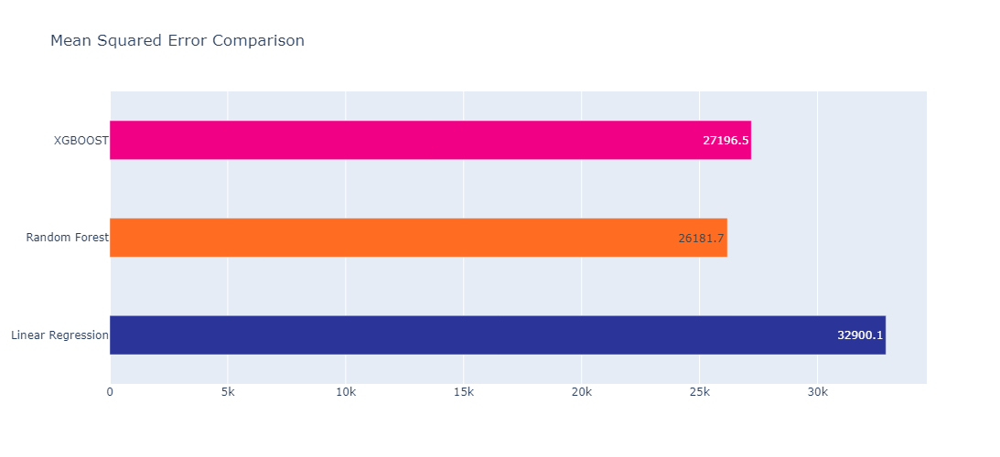

In [185]:
# plotting bar plot to comapre applied models based on Mean Squared Error 
fig = go.Figure(data=[go.Bar(
    y=result_data['Algo'],
    x=result_data['MSE'],
    marker_color=['#2B3499','#FF6C22','#F10086','#64CCC5','#C70039','#91C483'],
    width=0.4,
    text=result_data['MSE'],
    textposition='auto',
    orientation='h'
)])

fig.update_layout(
    title_text="Mean Squared Error Comparison",
    height=500,
    width=1000
)

fig.update_traces(texttemplate='%{text:.1f}', textposition='inside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')

fig.show()

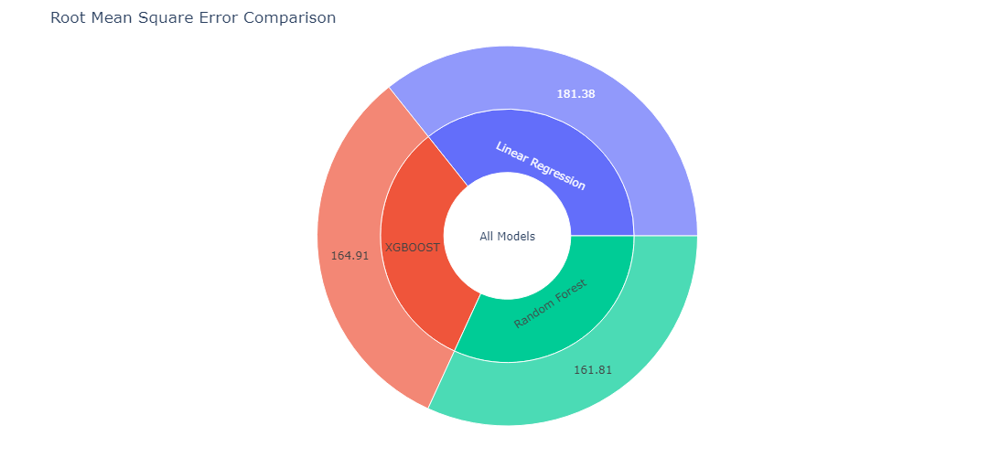

In [186]:
# Creating a sunburst plot
result_data['RMSE'] = result_data['RMSE'].round(2)
result_data['Parent'] = 'All Models'

fig = px.sunburst(
    result_data,
    path=['Parent', 'Algo', 'RMSE'],  
    values='RMSE',  
    )

fig.update_traces(
    marker=dict(colorscale=None)  
)


fig.update_layout(
    title_text="Root Mean Square Error Comparison",
    height=500,
    width=1000,
    margin=dict(t=50, l=50, r=34, b=34),
    uniformtext_minsize=8,
    showlegend=False,
    uniformtext_mode='hide',
)


# Show plot
fig.show()


# Predictions

In [213]:
data = pd.read_csv('final_merged_dataset.csv')         # reading data for predictions

In [223]:
data = data.drop('Unnamed: 0', axis=1)      # dropping unnecessary column

In [227]:
test_data = data.sample(frac = 0.0001)       # creating data for predictions

In [237]:
test_data['order_status'] = label_enc.fit_transform(test_data['order_status'])       # applying same label encoder
test_data['payment_type'] = label_enc.fit_transform(test_data['payment_type'])
test_data['customer_city'] = label_enc.fit_transform(test_data['customer_city'])
test_data['customer_state'] = label_enc.fit_transform(test_data['customer_state'])
test_data['product_id'] = label_enc.fit_transform(test_data['product_id'])
test_data['product_category_name_english'] = label_enc.fit_transform(test_data['product_category_name_english'])

In [233]:
test_data = test_data.drop(['sale'],axis=1)        # dropping the target column from data

In [239]:
test_data = scaler.transform(test_data)         # scaling the data

In [249]:
data_reduced_ = pca_comp.transform(test_data)     # applying PCA on data

In [253]:
predictions = rf.predict(data_reduced_)   # making predictions using best performing algorithm

In [255]:
predictions     # predictions made by algorithm

array([ 86.7265, 306.055 , 246.4604, 102.2666, 122.0742, 396.3008,
       236.2826, 712.5064, 171.0925, 211.1493])